# Granuloma spatial transcriptomics summary

## Overview

Scran normalization results:

### Table of Contents

* [Relevant libraries and colour dictionaries](#chapter1)
* [_plot_spatial_all_slides](#chapter2)
* [Load raw and processed data](#chapter3)
    * [adata](#section_3_1)
    * [adata_all](#section_3_2)
* [Spatial visualisations](#chapter4)
    * [Skin layer](#section_4_1)
    * [Spot type](#section_4_2)
    * [Leiden_granulom](#section_4_3)
* [Sophie's marker genes](#chapter5)
* [UMAPs](#chapter6)
    * [Preprocessed](#section_6_1)
    * [Batch vs no correction - coloured by spot type](#section_6_2)
    * [Batch vs no correction - coloured by skin layer](#section_6_3)
    * [Batch vs no correction - coloured by sample (DERMIS == 1, NON LESIONAL == 1, SAMPLE != 0)](#section_6_4)
    * [Batch vs no correction - coloured by sample (GRANULOMA == 1 and SAMPLE != 0)](#section_6_5)
    * [Exporting plots: before and after batch correction](#section_6_6)
    * [Exporting plots: all leiden resolutions (BC)](#section_6_7)
* [Slides](#chapter8)  
    * [Slides coloured by spot_type](#section_8_1)
    * [Slides coloured by skin_layer](#section_8_2)
    * [Slides coloured by leiden r = 1.3](#section_8_3)
    * [Slides coloured by counts, MT fraction](#section_8_4)
* [Preliminary DGE](#chapter7)

#### Relevant libraries and colour dictionaries <a class="anchor" id="chapter1"></a>

In [21]:
# Import relevant libraries
import numpy as np
import scanpy as sc
import os
import pandas as pd
import seaborn as sb
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sns
from collections import OrderedDict
from matplotlib import cm
import anndata as ann
import scanpy.external as sce
from datetime import datetime
%matplotlib inline

# Set current directory
os.chdir("/Users/mendenlab/work/spatial_granuloma/scripts")
import plot_functions.helper_functions as hf

# Initializing scanpy
sc.settings.verbosity = 0             # verbosity: errors (0), warnings (1), info (2), hints (3)
try:
    sc.logging.print_versions()
except AssertionError:
    sc.logging.print_versions()
# sc.settings.set_figure_params(dpi=80)
matplotlib.get_backend()

# containment radius
_1sigma = 0.682 * 100
_1_5sigma = 0.866 * 100
_2sigma = 0.954 * 100
_3sigma = 0.997 * 100
_simga_string = "\u03C3"

fig_size, title_fontsize, subtitle_fontsize, xy_fontsize, xy_ticks, legend_fontsize, text_fontsize, fileformat = \
    hf.plot_properties()


# assign the rigth colours to the right annotation
def _set_colors(adata, obs_name, colors):
    """Set palette with specific colors for specific categories

    Parameters
    ----------
    adata : annData
    obs_name : column to plot
    colors : OrderedDict(): colors named by categories

    Returns
    -------

    """
    if len(colors.values())>0:
        palette = []
        unique_colors = np.unique(adata.obs[obs_name])
        for key in adata.obs[obs_name].cat.categories.tolist():
            if key in colors.keys():
                palette.append(colors[key])
    return palette

#Set the colours per annotation
spot_colors = []
spot_colors = OrderedDict()
spot_colors["EPIDERMIS"] = 'blue'
spot_colors["DERMIS"] = '#E0EEE0'
spot_colors["INTERFACE"] = 'deepskyblue'
spot_colors["VESSEL"] = 'darkgreen'
spot_colors["HAIR FOLLICLE"] = "#543005"
spot_colors["SWEAT GLAND"] = 'y'
spot_colors["SEBACEOUS GLAND"] = 'mistyrose'
spot_colors["MUSCLE"] = 'darkcyan'
spot_colors["GA"] = 'firebrick'  
spot_colors["GNL"] = 'orchid'
spot_colors["GSS"] = 'blueviolet'
spot_colors["GSC"] = 'mediumvioletred'
spot_colors["UNDETERMINED"] = 'black'


dermis_colors = []
dermis_colors = OrderedDict()
dermis_colors["UNDETERMINED"] = 'black'
dermis_colors["upper EPIDERMIS"] = 'blue'
dermis_colors["middle EPIDERMIS"] = 'dodgerblue'
dermis_colors["basal EPIDERMIS"] = 'skyblue'
dermis_colors["DERdepth1"] = '#006837'
dermis_colors["DERdepth2"] = '#238443'
dermis_colors["DERdepth3"] = '#41AB5D'
dermis_colors["DERdepth4"] = '#78C679'
dermis_colors["DERdepth5"] = '#ADDD8E'
dermis_colors["DERdepth6"] = '#D9F0A3'
dermis_colors["DERdepth7"] = '#F7FCB9'


lesion_colors = []
lesion_colors = OrderedDict()
lesion_colors["LESIONAL"] = 'tomato'
lesion_colors["NON LESIONAL"] = 'darkolivegreen'
lesion_colors["UNDETERMINED"] = 'lightgrey'

cluster_colors = []
cluster_colors = OrderedDict()
tab20 = cm.get_cmap("tab20", lut = 20).colors
k = 0
for col in tab20:
    cluster_colors[str(k)] = col
    k = k+1

leiden_r08_colours = []
leiden_r08_colours = OrderedDict()
leiden_r08_colours["0"] = 'yellow'
leiden_r08_colours["1"] = "#F46D43"
leiden_r08_colours["2"] = '#E0EEE0'
leiden_r08_colours["3"] = '#D9F0A3'
leiden_r08_colours["4"] = "#EAADE7"
leiden_r08_colours["5"] = 'deepskyblue'
leiden_r08_colours["6"] = 'orchid'
leiden_r08_colours["7"] = '#D53E4F'
leiden_r08_colours["8"] = 'darkgreen'
leiden_r08_colours["9"] = '#ADDD8E'
leiden_r08_colours["10"] = 'blueviolet'
leiden_r08_colours["11"] = 'skyblue'
leiden_r08_colours["12"] = 'blue'
leiden_r08_colours["13"] = 'mediumvioletred'
leiden_r08_colours["14"] = 'mistyrose'
leiden_r08_colours["15"] = '#9E0142'
leiden_r08_colours["16"] = 'darkcyan'

leiden_r13_colours = []
leiden_r13_colours = OrderedDict()
leiden_r13_colours["0"] = 'darkolivegreen'
leiden_r13_colours["1"] = "#D9F0A3"
leiden_r13_colours["2"] = '#238443'
leiden_r13_colours["3"] = 'firebrick'
leiden_r13_colours["4"] = '#78C679'
leiden_r13_colours["5"] = '#78C679'
leiden_r13_colours["6"] = '#41AB5D'
leiden_r13_colours["7"] = '#006837'
leiden_r13_colours["8"] = '#ADDD8E'
leiden_r13_colours["9"] = "#238443"
leiden_r13_colours["10"] = '#78C679'
leiden_r13_colours["11"] = 'blue'
leiden_r13_colours["12"] = 'orchid'
leiden_r13_colours["13"] = '#F46D43'
leiden_r13_colours["14"] = 'dodgerblue'
leiden_r13_colours["15"] = 'deepskyblue'
leiden_r13_colours["16"] = '#cfafaf'
leiden_r13_colours["17"] = 'yellow'
leiden_r13_colours["18"] = 'darkcyan'
leiden_r13_colours["19"] = '#006837'

granuloma_only_colours = []
granuloma_only_colours = OrderedDict()
granuloma_only_colours["EPIDERMIS"] = 'lightgrey'
granuloma_only_colours["DERMIS"] = 'lightgrey'
granuloma_only_colours["INTERFACE"] = 'lightgrey'
granuloma_only_colours["VESSEL"] = 'lightgrey'
granuloma_only_colours["HAIR FOLLICLE"] = "lightgrey"
granuloma_only_colours["SWEAT GLAND"] = 'lightgrey'
granuloma_only_colours["SEBACEOUS GLAND"] = 'lightgrey'
granuloma_only_colours["MUSCLE"] = 'lightgrey'
granuloma_only_colours["GA"] = 'firebrick'  
granuloma_only_colours["GNL"] = 'orchid'
granuloma_only_colours["GSS"] = 'blueviolet'
granuloma_only_colours["GSC"] = 'mediumvioletred'
granuloma_only_colours["UNDETERMINED"] = 'black'

ga_only_colours = []
ga_only_colours = OrderedDict()
ga_only_colours["EPIDERMIS"] = 'lightgrey'
ga_only_colours["DERMIS"] = 'lightgrey'
ga_only_colours["INTERFACE"] = 'lightgrey'
ga_only_colours["VESSEL"] = 'lightgrey'
ga_only_colours["HAIR FOLLICLE"] = "lightgrey"
ga_only_colours["SWEAT GLAND"] = 'lightgrey'
ga_only_colours["SEBACEOUS GLAND"] = 'lightgrey'
ga_only_colours["MUSCLE"] = 'lightgrey'
ga_only_colours["GA"] = 'firebrick'  
ga_only_colours["GNL"] = 'lightgrey'
ga_only_colours["GSS"] = 'lightgrey'
ga_only_colours["GSC"] = 'lightgrey'
ga_only_colours["UNDETERMINED"] = 'black'

gnl_only_colours = []
gnl_only_colours = OrderedDict()
gnl_only_colours["EPIDERMIS"] = 'lightgrey'
gnl_only_colours["DERMIS"] = 'lightgrey'
gnl_only_colours["INTERFACE"] = 'lightgrey'
gnl_only_colours["VESSEL"] = 'lightgrey'
gnl_only_colours["HAIR FOLLICLE"] = "lightgrey"
gnl_only_colours["SWEAT GLAND"] = 'lightgrey'
gnl_only_colours["SEBACEOUS GLAND"] = 'lightgrey'
gnl_only_colours["MUSCLE"] = 'lightgrey'
gnl_only_colours["GA"] = 'lightgrey'  
gnl_only_colours["GNL"] = 'orchid'
gnl_only_colours["GSS"] = 'lightgrey'
gnl_only_colours["GSC"] = 'lightgrey'
gnl_only_colours["UNDETERMINED"] = 'black'

gsc_only_colours = []
gsc_only_colours = OrderedDict()
gsc_only_colours["EPIDERMIS"] = 'lightgrey'
gsc_only_colours["DERMIS"] = 'lightgrey'
gsc_only_colours["INTERFACE"] = 'lightgrey'
gsc_only_colours["VESSEL"] = 'lightgrey'
gsc_only_colours["HAIR FOLLICLE"] = "lightgrey"
gsc_only_colours["SWEAT GLAND"] = 'lightgrey'
gsc_only_colours["SEBACEOUS GLAND"] = 'lightgrey'
gsc_only_colours["MUSCLE"] = 'lightgrey'
gsc_only_colours["GA"] = 'lightgrey'  
gsc_only_colours["GNL"] = 'lightgrey'
gsc_only_colours["GSS"] = 'lightgrey'
gsc_only_colours["GSC"] = 'mediumvioletred'
gsc_only_colours["UNDETERMINED"] = 'black'

gss_only_colours = []
gss_only_colours = OrderedDict()
gss_only_colours["EPIDERMIS"] = 'lightgrey'
gss_only_colours["DERMIS"] = 'lightgrey'
gss_only_colours["INTERFACE"] = 'lightgrey'
gss_only_colours["VESSEL"] = 'lightgrey'
gss_only_colours["HAIR FOLLICLE"] = "lightgrey"
gss_only_colours["SWEAT GLAND"] = 'lightgrey'
gss_only_colours["SEBACEOUS GLAND"] = 'lightgrey'
gss_only_colours["MUSCLE"] = 'lightgrey'
gss_only_colours["GA"] = 'lightgrey'  
gss_only_colours["GNL"] = 'lightgrey'
gss_only_colours["GSS"] = 'blueviolet'
gss_only_colours["GSC"] = 'lightgrey'
gss_only_colours["UNDETERMINED"] = 'black'

#print(cm.get_cmap("Set3").colors)
#set3_5 = cm.get_cmap("Set3", lut = 5)
#print(set3_5.colors)
#print(cluster_colors)


# To select neighbouring spots
def index_spots(spot_coordinate, d):
    """Get index of nearest neighbor spots
        k: index of row
        m: index of column

    Parameters
    ----------
    spot_coordinate : numpy.array
        coordinate of spot of interest
    d : int
        distance of spot of interest to its next neighbor spots

    Returns
    -------

    """

    ind_list = []
    for k in range(-d, d + 1):
        m_max = 2 * d - np.abs(k)
        for m in range(-m_max, m_max + 1, 2):
            if m == 0 and k == 0:
                continue
            else:
                ind_list.append((spot_coordinate[0] + m, spot_coordinate[1] + k))

    return ind_list

-----
anndata     0.7.8
scanpy      1.8.2
sinfo       0.3.1
-----
PIL                         9.0.1
anndata                     0.7.8
appnope                     0.1.2
asciitree                   NA
asttokens                   NA
attr                        21.4.0
backcall                    0.2.0
beta_ufunc                  NA
binom_ufunc                 NA
cffi                        1.15.0
cloudpickle                 2.0.0
colorama                    0.4.4
cycler                      0.10.0
cython_runtime              NA
cytoolz                     0.11.2
dask                        2022.02.1
dateutil                    2.8.2
debugpy                     1.5.1
decorator                   5.1.1
defusedxml                  0.7.1
entrypoints                 0.4
executing                   0.8.3
fasteners                   0.17.3
fsspec                      2022.02.0
h5py                        3.6.0
hypergeom_ufunc             NA
idna                        3.3
igraph                   

#### _plot_spatial_all_slides <a class="anchor" id="chapter2"></a>

In [34]:
# To create a pdf with all the spatial info proyected onto the tissue images
# obs name --> by what colours you want to plot, my colours --> colour dictionary
# filename --> where to save it to
# handles and labels --> to have only 1 legend for all plots. 


def _plot_spatial_all_slides(adata = None, obs_name = 'spot_type', my_colors = None,
                             filename = 'test.pdf', 
                             handles = None, labels = None, alpha_image = 1):
    """Plot all 12 capture areas

    Parameters
    ----------


    Returns
    -------

    """
    fig, axes = plt.subplots(facecolor = 'w', edgecolor = 'k', figsize = (35, 10), dpi = 300)
    fig.subplots_adjust(bottom = 0.05, left = 0.05, top = 0.95, right = 0.87)
    axes.axis("off")
    k = 1
    for key in adata.uns['spatial'].keys():
        print(key)
        ax = fig.add_subplot(2, 6, k)
        adata_key = adata[adata.obs['sample'] == key]
        if adata_key.n_obs>0 :
            if my_colors==None :
                #sc.pl.spatial(adata2, size=1, img_key='lowres',
                #              color='LESIONAL', #palette=_set_colors(adata2, 'spot_type', spot_colors),
                #              zorder=2, alpha_img=1, ax=ax)
                sc.pl.spatial(adata_key, size = 1, img_key ='hires', library_id = key,
                              color = obs_name,
                              zorder = 2, alpha_img = alpha_image, ax = ax,
                              show = False, title = key)
                ax.axis("off")
                if ((k==2) | (k==10) | (k==6)):      #to invert orientation for some capture areas
                    ax.invert_xaxis()
                    ax.invert_yaxis()

            else :
                #sc.pl.spatial(adata2, size=1, img_key='lowres',
                #              color='LESIONAL', #palette=_set_colors(adata2, 'spot_type', spot_colors),
                #              zorder=2, alpha_img=1, ax=ax)
                sc.pl.spatial(adata_key, size=1, img_key='hires', library_id=key,
                              legend_loc='upper right',
                              color=obs_name, palette=_set_colors(adata_key, obs_name, my_colors),
                              zorder=2, alpha_img = alpha_image, ax=ax,
                              show=False, title=key)
                ax.axis("off")
                if ((k==2) | (k==10) | (k==6)):
                    ax.invert_xaxis() 
                    ax.invert_yaxis()

        k=k+1

    if (handles!=None) & (labels!=None):
        fig.legend(handles, labels, loc='center right')
        
    if (filename!=None) :
        plt.savefig(filename)
    
    plt.show()
    
    return fig, axes

#### Load raw and processed data: <a class="anchor" id="chapter3"></a> 

In [15]:
print(os.getcwd())

/Users/mendenlab/work/spatial_granuloma/scripts


#### adata: <a class="anchor" id="section_3_1"></a> 

In [16]:
adata_path = "../results/current/"

# Basic preprocessing steps (mitochondrial genes, log counts...) to obtain the raw data file (no corrections)
# Saved as Granuloma_raw_data.h5. If the file already exists --> import raw data directly
if not os.path.isfile(os.path.join(adata_path, "final/Granuloma_raw_data.h5")):
    adata_raw = sc.read(os.path.join(adata_path, "2022-03-09/scran/0_Spatial Transcriptomics_unpp.h5"))
    adata_raw.obs['n_counts'] = adata_raw.X.sum(1)
    adata_raw.obs['log_counts'] = np.log(adata_raw.obs['n_counts'])
    adata_raw.obs['n_genes'] = (adata_raw.X > 0).sum(1)
    mt_gene_mask = [gene.startswith('MT-') for gene in adata_raw.var_names]
    adata_raw.obs['mt_frac'] = adata_raw.X[:, mt_gene_mask].sum(1) / adata_raw.obs['n_counts']
    sc.write(os.path.join(adata_path, "final/Granuloma_raw_data.h5"), adata_raw)
else:
    adata_raw = sc.read(os.path.join(adata_path, "final/Granuloma_raw_data.h5"))

# Using PCA as basis to compute neighbours and UMAPS. 
# Then perform Leiden clustering:
# - normalisation + QC, no patient correction
# - normalisation + QC + patient correction
# It will only compute this if the file Granuloma_QC_clustering.h5 does not exist already, otherwise it will just load it
if not os.path.isfile(os.path.join(adata_path, "final/Granuloma_QC_clustering.h5")): # already has some batch correction + normalisation + clustering
    adata = sc.read(os.path.join(adata_path, "2022-03-09/scran/5_st_QC_normed_BC.h5")) # batch corrected info for disease and biobank id (patient)
  
    # using PCA as basis compute neighbours, then UMAPs
    sc.pp.pca(adata, n_comps=50)
    sc.pp.neighbors(adata, key_added='neighbors_pp')
    sc.tl.umap(adata, neighbors_key='neighbors_pp')
    adata.obsm['X_umap_pp'] = adata.obsm['X_umap'] #X_umap_pp has the UMAP resulting of preprocessing (no batch correction)

    # Perform Leiden clustering with different resolution parameters (just normalisation and QC, no batch correction)
    sc.tl.leiden(adata, resolution=5,
                 neighbors_key='neighbors_pp',
                 key_added='leiden_r5')
    sc.tl.leiden(adata, resolution=3,
                 neighbors_key='neighbors_pp',
                 key_added='leiden_r3')
    sc.tl.leiden(adata, resolution=1.5,
                 neighbors_key='neighbors_pp',
                 key_added='leiden_r1.5')
    sc.tl.leiden(adata, resolution=1.3,
                 neighbors_key='neighbors_pp',
                 key_added='leiden_r1.3')
    sc.tl.leiden(adata, resolution=1.0,
                 neighbors_key='neighbors_pp',
                 key_added='leiden_r1.0')
    sc.tl.leiden(adata, resolution=0.8,
                 neighbors_key='neighbors_pp',
                 key_added='leiden_r0.8')
    sc.tl.leiden(adata, resolution=0.5,
                 neighbors_key='neighbors_pp',
                 key_added='leiden_r0.5')
    sc.tl.leiden(adata, resolution=0.3,
                 neighbors_key='neighbors_pp',
                 key_added='leiden_r0.3')
    
    # Perform Leiden clustering with different resolution parameters - using highly variable genes (with patient batch correction)
    sc.tl.leiden(adata, resolution=5,
                 neighbors_key='neighbors_bc_BIOBANK',
                 key_added='leiden_r5_patient')
    sc.tl.leiden(adata, resolution=3,
                 neighbors_key='neighbors_bc_BIOBANK',
                 key_added='leiden_r3_patient')
    sc.tl.leiden(adata, resolution=1.5,
                 neighbors_key='neighbors_bc_BIOBANK',
                 key_added='leiden_r1.5_patient')
    sc.tl.leiden(adata, resolution=1.3,
                 neighbors_key='neighbors_bc_BIOBANK',
                 key_added='leiden_r1.3_patient')
    sc.tl.leiden(adata, resolution=1.0,
                 neighbors_key='neighbors_bc_BIOBANK',
                 key_added='leiden_r1.0_patient')
    sc.tl.leiden(adata, resolution=0.8,
                 neighbors_key='neighbors_bc_BIOBANK',
                 key_added='leiden_r0.8_patient')
    sc.tl.leiden(adata, resolution=0.5,
                 neighbors_key='neighbors_bc_BIOBANK',
                 key_added='leiden_r0.5_patient')
    sc.tl.leiden(adata, resolution=0.3,
                 neighbors_key='neighbors_bc_BIOBANK',
                 key_added='leiden_r0.3_patient')
    
    sc.write(os.path.join(adata_path, "final/Granuloma_QC_clustering.h5"), adata)
else:
    adata = sc.read(os.path.join(adata_path, "final/Granuloma_QC_clustering.h5"))
    
# setting up "factors" with different levels, order = TRUE
# add less common annotations LAST so they are not overwritten

# Set spot_type and skin_layer as categories and define the levels in each category
# Spot type: annatomical annotations
adata.obs['spot_type'] = pd.Categorical(
    adata.obs['spot_type'],
    categories = ['UNDETERMINED', 'DERMIS', "EPIDERMIS", 'INTERFACE', 'HAIR FOLLICLE',
                'VESSEL', 'MUSCLE', 'SEBACEOUS GLAND', 'SWEAT GLAND', 'GA', 'GNL', 'GSS', 'GSC'],
                 ordered = True)

# Skin layer
adata.obs['skin_layer'] = pd.Categorical(
    adata.obs['skin_layer'],
    categories = ['UNDETERMINED', 
                'upper EPIDERMIS', 'middle EPIDERMIS', 'basal EPIDERMIS',
                'DERdepth1', 'DERdepth2', 'DERdepth3', 'DERdepth4',
                'DERdepth5', 'DERdepth6', 'DERdepth7'],
    ordered = True)

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


In [17]:
### Spot type and skin layer overview

# To get a summary of all the categories of an observation
adata.obs['spot_type'].value_counts() 
adata.obs['skin_layer'].value_counts()

# Get spatial coordinates of a spot
#data.obs['array_col'] 
#adata.obs['array_row']

#print(adata.obs["sample"][adata.obs['skin_layer']=='OTHER']) #prints all spots marked as OTHER (no annotation)
#print(adata.obs["sample"][adata.obs['skin_layer']=='DERMIS']) #prints all spots marked as OTHER (no annotation)

#print(pd.crosstab(adata.obs['upper EPIDERMIS'],adata.obs['basal EPIDERMIS']))
#print("")
#print(pd.crosstab(adata.obs['middle EPIDERMIS'],adata.obs['basal EPIDERMIS']))
#print("")
#print(pd.crosstab(adata.obs['upper EPIDERMIS'],adata.obs['middle EPIDERMIS']))
#print("")
#print("")
#print(pd.crosstab(adata.obs['upper EPIDERMIS'],adata.obs['DERMIS']))
#print("")
#print(pd.crosstab(adata.obs['middle EPIDERMIS'],adata.obs['DERMIS']))
#print("")
#print(pd.crosstab(adata.obs['basal EPIDERMIS'],adata.obs['DERMIS']))

#print("")
#"UNDETERMINED" in adata.obs['skin_layer']

DERdepth4           2815
DERdepth3           2710
DERdepth5           2477
DERdepth2           2239
DERdepth1           1517
DERdepth6           1306
UNDETERMINED         847
upper EPIDERMIS      713
basal EPIDERMIS      440
DERdepth7            419
middle EPIDERMIS     294
Name: skin_layer, dtype: int64

#### adata_all: <a class="anchor" id="section_3_2"></a> 

In [18]:
# Compare patients samples individually (per patient) --> compute leiden clustering per patient individually, 
#concatenate them --> adata_all, 
#and for all patients, cluster the granuloma spots across patients
# This is done to try and find sub-areas within granulomas --> we probably need a different approach

#adata.obs['BIOBANK'].astype('str').unique()

if not os.path.isfile(os.path.join(adata_path, "final/Granuloma_QC_clustering_p1.h5")):
    print('computing leiden clusters per patient and saving in final folder')
    adata_p1 = adata[adata.obs['BIOBANK']=='91253']
    sc.pp.neighbors(adata_p1, key_added='neighbors_pp2',
                    use_rep='X_pca_uc')
    sc.tl.leiden(adata_p1, resolution=1.3,
                 neighbors_key='neighbors_pp2',
                 key_added='leiden_patient_ind')
    sc.write(os.path.join(adata_path, "final/Granuloma_QC_clustering_p1.h5"), adata_p1)
    adata_p2 = adata[adata.obs['BIOBANK']=='45703']
    sc.pp.neighbors(adata_p2, key_added='neighbors_pp2',
                   use_rep='X_pca_uc')
    sc.tl.leiden(adata_p2, resolution=1.3,
                 neighbors_key='neighbors_pp2',
                 key_added='leiden_patient_ind')
    sc.write(os.path.join(adata_path, "final/Granuloma_QC_clustering_p2.h5"), adata_p2)

    adata_p3 = adata[adata.obs['BIOBANK']=='50107']
    sc.pp.neighbors(adata_p3, key_added='neighbors_pp2',
                   use_rep='X_pca_uc')
    sc.tl.leiden(adata_p3, resolution=1.3,
                 neighbors_key='neighbors_pp2',
                 key_added='leiden_patient_ind')
    sc.write(os.path.join(adata_path, "final/Granuloma_QC_clustering_p3.h5"), adata_p3)

    adata_p4 = adata[adata.obs['BIOBANK']=='95096']
    sc.pp.neighbors(adata_p4, key_added='neighbors_pp2',
                   use_rep='X_pca_uc')
    sc.tl.leiden(adata_p4, resolution=1.3,
                 neighbors_key='neighbors_pp2',
                 key_added='leiden_patient_ind')
    sc.write(os.path.join(adata_path, "final/Granuloma_QC_clustering_p4.h5"), adata_p4)

    adata_p5 = adata[adata.obs['BIOBANK']=='82301']
    sc.pp.neighbors(adata_p5, key_added='neighbors_pp2',
                   use_rep='X_pca_uc')
    sc.tl.leiden(adata_p5, resolution=1.3,
                 neighbors_key='neighbors_pp2',
                 key_added='leiden_patient_ind')
    sc.write(os.path.join(adata_path, "final/Granuloma_QC_clustering_p5.h5"), adata_p5)

    adata_p6 = adata[adata.obs['BIOBANK']=='72859']
    sc.pp.neighbors(adata_p6, key_added='neighbors_pp2',
                   use_rep='X_pca_uc')
    sc.tl.leiden(adata_p6, resolution=1.3,
                 neighbors_key='neighbors_pp2',
                 key_added='leiden_patient_ind') 
    sc.write(os.path.join(adata_path, "final/Granuloma_QC_clustering_p6.h5"), adata_p6)
    
    adata_all = ann.concat([adata_p1, adata_p2, adata_p3, adata_p4, adata_p5, adata_p6])
    
    adata2 = adata[adata.obs['GRANULOMA']==1]
    sc.pp.neighbors(adata2, key_added='neighbors_bc_BIOBANK',
                   use_rep='X_emb_BIOBANK')
    sc.tl.leiden(adata2, resolution=1,
                 neighbors_key='neighbors_bc_BIOBANK',
                 key_added='leiden_granulom_1')
    sc.tl.leiden(adata2, resolution=1.3,
                 neighbors_key='neighbors_bc_BIOBANK',
                 key_added='leiden_granulom_1.3')
    sc.tl.leiden(adata2, resolution=1.5,
                 neighbors_key='neighbors_bc_BIOBANK',
                 key_added='leiden_granulom_1.5')
    sc.tl.leiden(adata2, resolution=3,
                 neighbors_key='neighbors_bc_BIOBANK',
                 key_added='leiden_granulom_3')
    
    adata_all.obs['leiden_granulom'] = '99'
    adata2.obs['leiden_granulom'] = adata2.obs['leiden_granulom_1.3']
    adata_all = ann.concat([adata_all[adata_all.obs['GRANULOMA']==0], adata2])
    # We need to explicitely copy the .uns, .var, .varm, .obsp objects from adata to adata_all 
    adata_all.uns = adata.uns 
    adata_all.var = adata.var
    adata_all.varm = adata.varm
    adata_all.obsp = adata.obsp
    
    sc.write(os.path.join(adata_path, "final/Granuloma_QC_clustering_granuloma_spots.h5"), adata2)
    sc.write(os.path.join(adata_path, "final/Granuloma_QC_clustering_annotations.h5"), adata_all)
    
    #adata = adata_all # From now on our adata object will be the adata_all we just created
    
else:
    print('leiden clusters already computed - reading in files from final folder')
    adata_p1 = sc.read(os.path.join(adata_path, "final/Granuloma_QC_clustering_p1.h5"))
    adata_p2 = sc.read(os.path.join(adata_path, "final/Granuloma_QC_clustering_p2.h5"))
    adata_p3 = sc.read(os.path.join(adata_path, "final/Granuloma_QC_clustering_p3.h5"))
    adata_p4 = sc.read(os.path.join(adata_path, "final/Granuloma_QC_clustering_p4.h5"))
    adata_p5 = sc.read(os.path.join(adata_path, "final/Granuloma_QC_clustering_p5.h5"))
    adata_p6 = sc.read(os.path.join(adata_path, "final/Granuloma_QC_clustering_p6.h5"))
    
    adata2 = sc.read(os.path.join(adata_path, "final/Granuloma_QC_clustering_granuloma_spots.h5"))
    adata_all = sc.read(os.path.join(adata_path, "final/Granuloma_QC_clustering_annotations.h5"))
    #adata = sc.read(os.path.join(adata_path, "final/Granuloma_QC_clustering_annotations.h5")) # From now on our adata object will be the adata_all we just created

leiden clusters already computed - reading in files from final folder


Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


In [9]:
#concatenate all the different files
# print(pd.crosstab(adata_p1.obs['leiden_patient_ind'],adata_p1.obs['spot_type']))
# print(pd.crosstab(adata_p2.obs['leiden_patient_ind'],adata_p2.obs['spot_type']))
# print(pd.crosstab(adata_p3.obs['leiden_patient_ind'],adata_p3.obs['spot_type']))
# print(pd.crosstab(adata_p4.obs['leiden_patient_ind'],adata_p4.obs['spot_type']))
# print(pd.crosstab(adata_p5.obs['leiden_patient_ind'],adata_p5.obs['spot_type']))
# print(pd.crosstab(adata_p6.obs['leiden_patient_ind'],adata_p6.obs['spot_type']))

#### Spatial visualisations <a class="anchor" id="chapter4"></a>

In [ ]:
# # Spatial visualisations for patient P17851 (slides 1 + 2))

# # Leiden_patient_ind --> leiden clusters computed only with P17851 data
# fig = plt.figure(facecolor='w', edgecolor='k', figsize=(25, 8))
# fig.subplots_adjust(bottom=0.05, left=0.05, top=0.95, right=0.75)
# sub1 = fig.add_subplot(1, 1, 1)
# sc.pl.spatial(adata_p1[adata_p1.obs['sample']=='P17851_1001'], #with & we can select specific spots, e.g. deeper keratynocytes etc
#               library_id='P17851_1001', ax=sub1,
#               color='leiden_patient_ind',
#               palette=_set_colors(adata_p1[adata_p1.obs['sample']=='P17851_1001'],
#                                   'leiden_patient_ind', cluster_colors),
#               #legend_loc='upper right',
#               size=1, img_key='hires', alpha_img=1, alpha=1)

# # Spot type 
# fig = plt.figure(facecolor='w', edgecolor='k', figsize=(25, 8))
# fig.subplots_adjust(bottom=0.05, left=0.05, top=0.95, right=0.75)
# sub1 = fig.add_subplot(1, 1, 1)
# sc.pl.spatial(adata[adata.obs['sample']=='P17851_1001'],
#               library_id='P17851_1001', ax=sub1,
#               color='spot_type',
#               palette=_set_colors(adata[adata.obs['sample']=='P17851_1001'],
#                                   'spot_type', spot_colors),
#               #legend_loc='upper right',
#               size=1, img_key='hires', alpha_img=1, alpha=1)

# fig = plt.figure(facecolor='w', edgecolor='k', figsize=(25, 8))
# fig.subplots_adjust(bottom=0.05, left=0.05, top=0.95, right=0.75)
# sub2 = fig.add_subplot(1, 1, 1)
# sc.pl.spatial(adata_p1[adata_p1.obs['sample']=='P17851_1002'],
#               library_id='P17851_1002', ax=sub2,
#               color='leiden_patient_ind',
#               palette=_set_colors(adata_p1[adata_p1.obs['sample']=='P17851_1002'],
#                                   'leiden_patient_ind', cluster_colors),
#               #legend_loc='upper right',
#               size=1, img_key='hires', alpha_img=1, alpha=1)

# fig = plt.figure(facecolor='w', edgecolor='k', figsize=(25, 8))
# fig.subplots_adjust(bottom=0.05, left=0.05, top=0.95, right=0.75)
# sub1 = fig.add_subplot(1, 1, 1)
# sc.pl.spatial(adata[adata.obs['sample']=='P17851_1002'],
#               library_id='P17851_1002', ax=sub1,
#               color='spot_type',
#               palette=_set_colors(adata[adata.obs['sample']=='P17852_1002'],
#                                   'spot_type', spot_colors),
#               #legend_loc='upper right',
#               size=1, img_key='hires', alpha_img=1, alpha=1)

#### Skin layer <a class="anchor" id="section_4_1"></a>

Trying to set attribute `._uns` of view, copying.


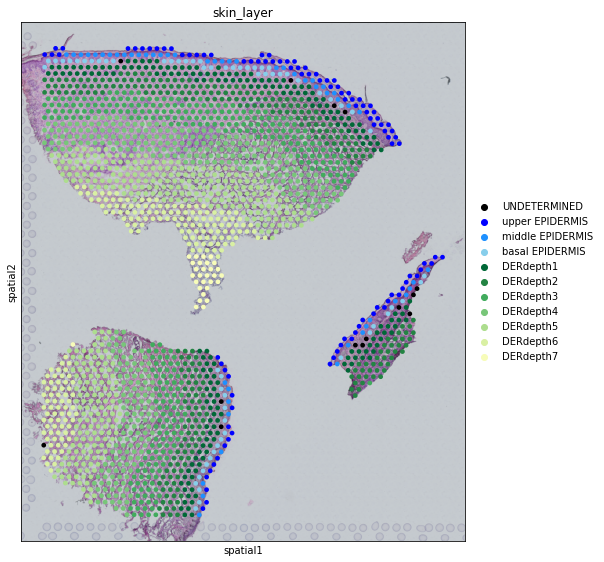

Trying to set attribute `._uns` of view, copying.


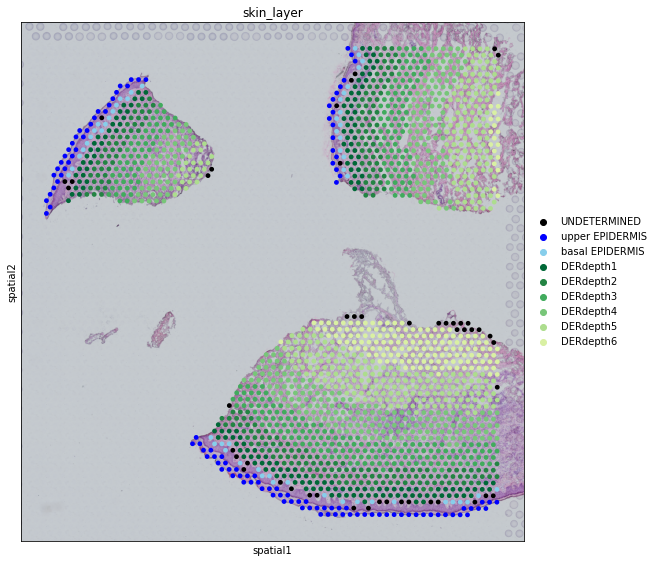

Trying to set attribute `._uns` of view, copying.


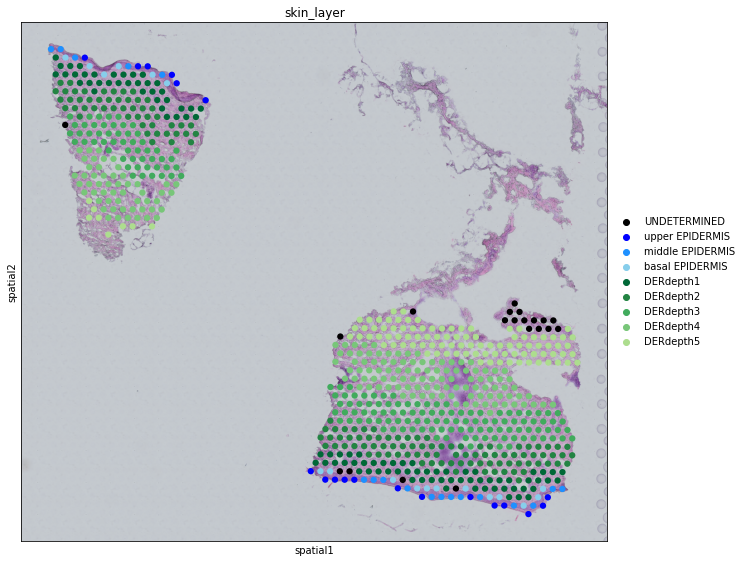

Trying to set attribute `._uns` of view, copying.


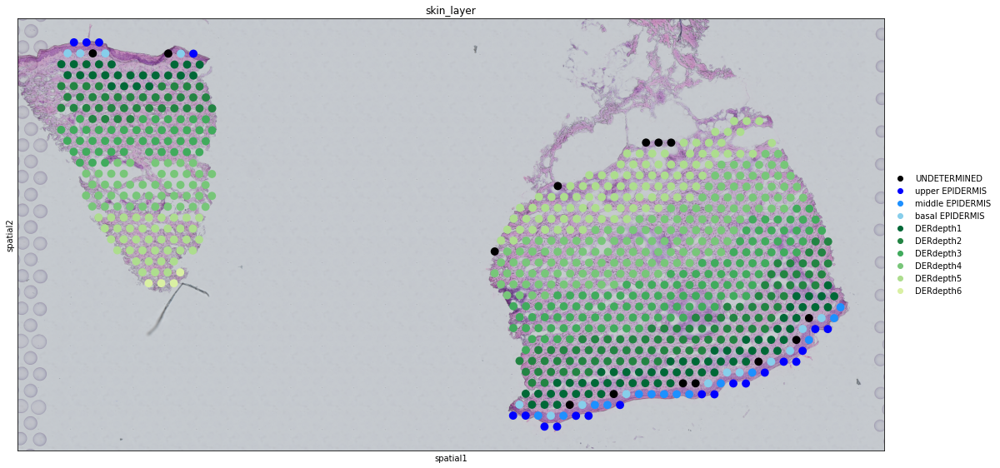

Trying to set attribute `._uns` of view, copying.


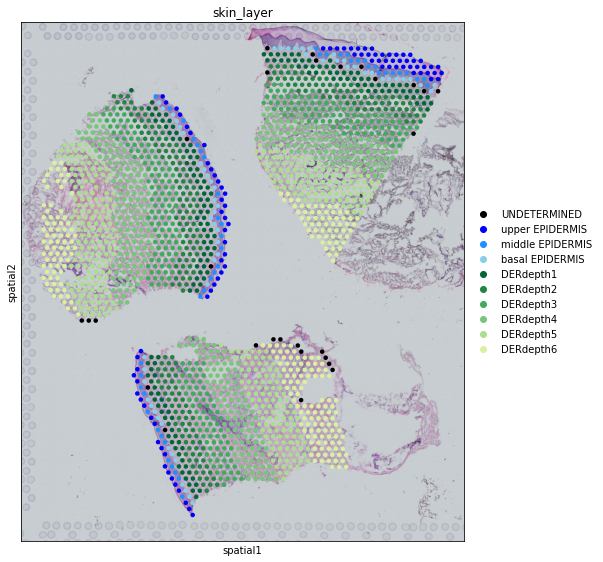

Trying to set attribute `._uns` of view, copying.


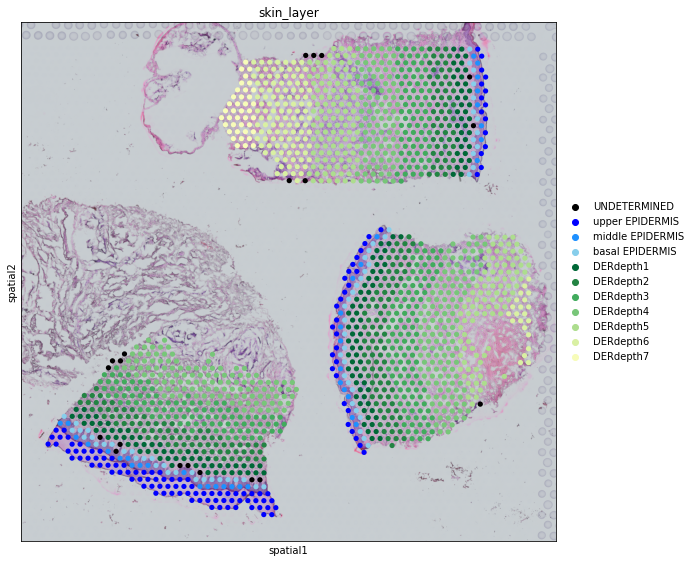

Trying to set attribute `._uns` of view, copying.


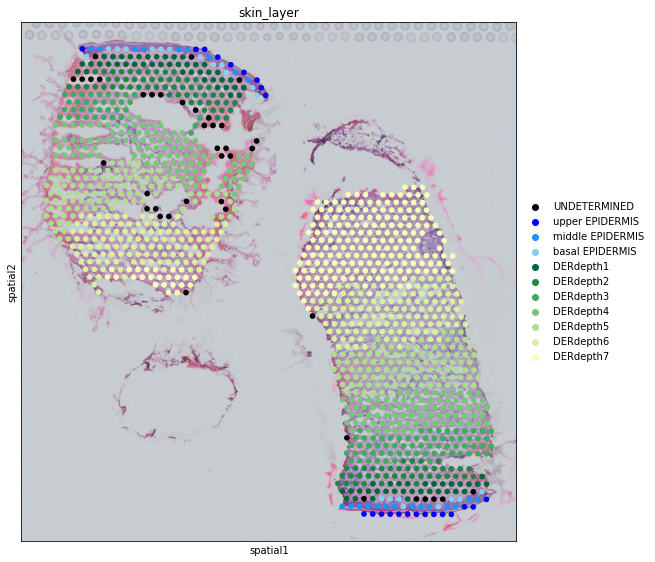

Trying to set attribute `._uns` of view, copying.


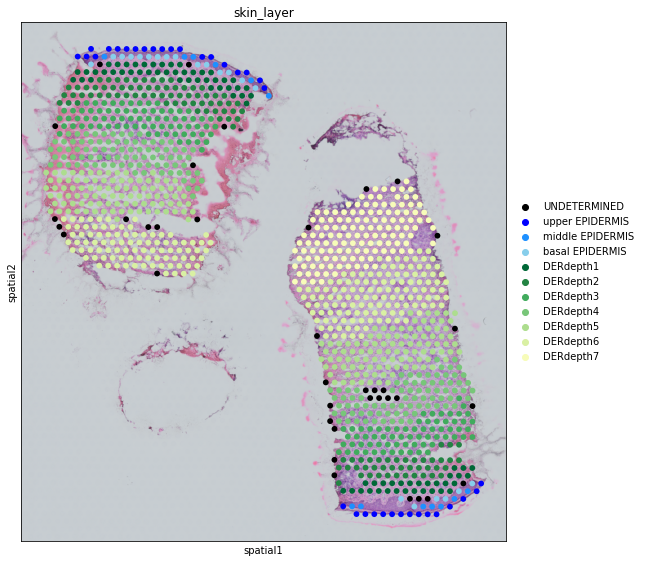

Trying to set attribute `._uns` of view, copying.


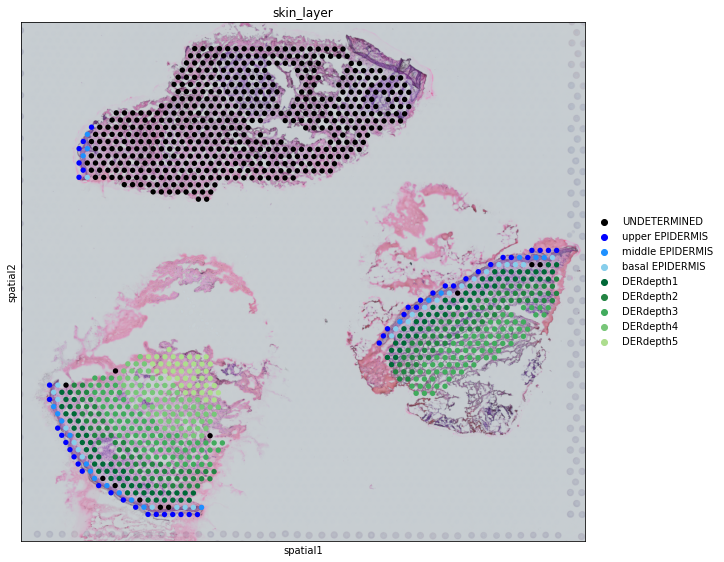

Trying to set attribute `._uns` of view, copying.


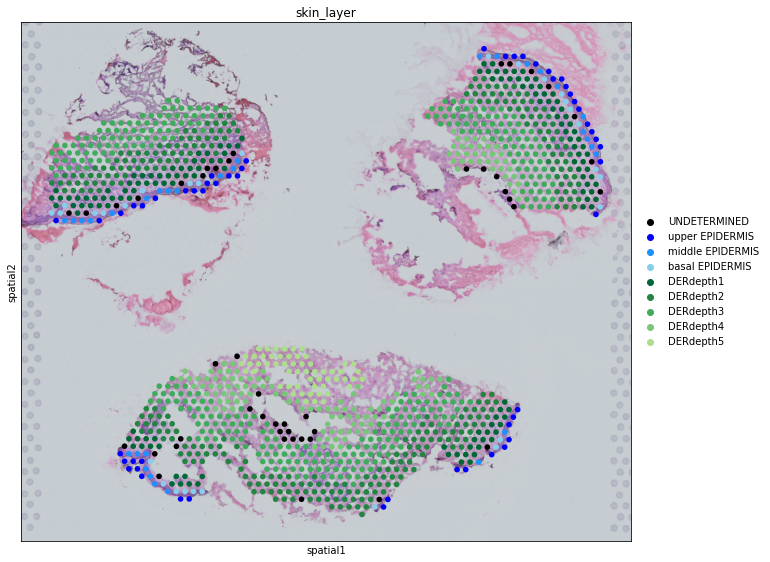

Trying to set attribute `._uns` of view, copying.


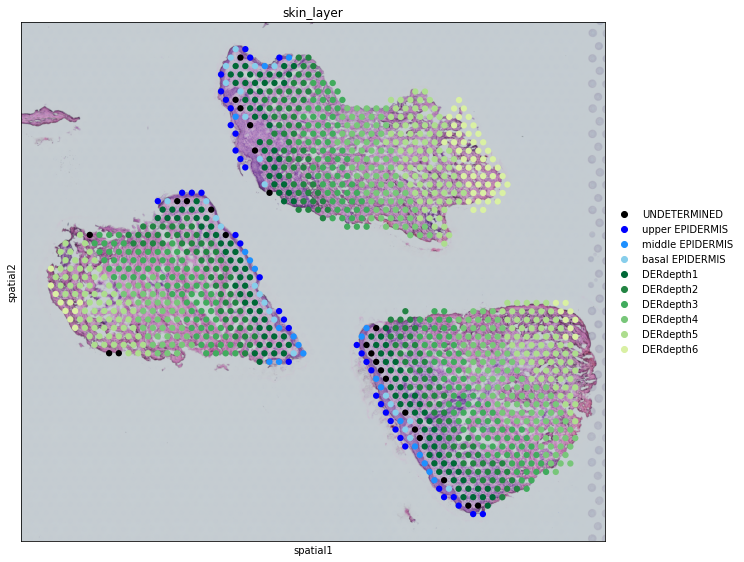

Trying to set attribute `._uns` of view, copying.


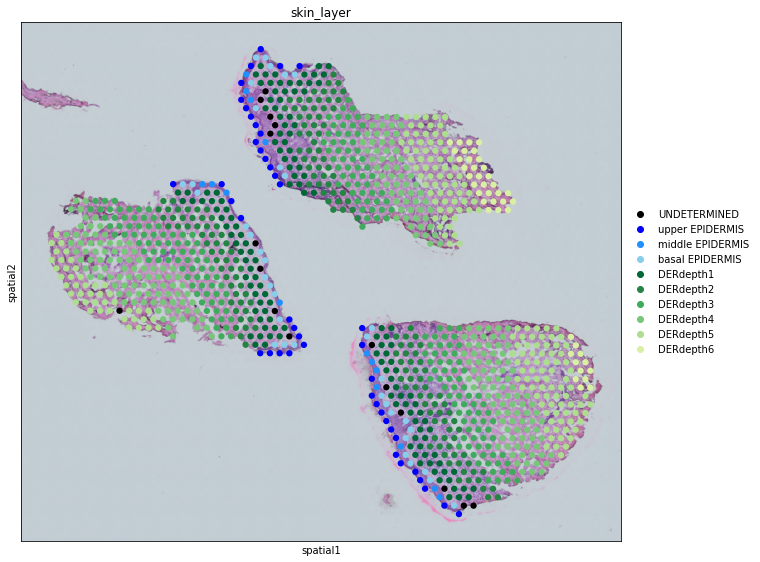

In [22]:
# Plot skin layers
# 'P17851_1001', 'P17851_1002', 'P17851_1003', 'P17851_1004', ..., 'P18554_1005', 'P18554_1006', 'P18554_1007', 'P18554_1008'


fig = plt.figure(facecolor='w', edgecolor='k', figsize=(25, 8))
fig.subplots_adjust(bottom=0.05, left=0.05, top=0.95, right=0.75)
sub1 = fig.add_subplot(1, 1, 1)
sc.pl.spatial(adata[adata.obs['sample']=='P17851_1001'],
              library_id='P17851_1001', ax=sub1,
              color='skin_layer',
              palette=_set_colors(adata[adata.obs['sample']=='P17851_1001'],
                                  'skin_layer', dermis_colors),
              #legend_loc='upper right',
              size=1, img_key='hires', alpha_img=1, alpha=1)

fig = plt.figure(facecolor='w', edgecolor='k', figsize=(25, 8))
fig.subplots_adjust(bottom=0.05, left=0.05, top=0.95, right=0.75)
sub1 = fig.add_subplot(1, 1, 1)
sc.pl.spatial(adata[adata.obs['sample']=='P17851_1002'],
              library_id='P17851_1002', ax=sub1,
              color='skin_layer',
              palette=_set_colors(adata[adata.obs['sample']=='P17851_1002'],
                                  'skin_layer', dermis_colors),
              #legend_loc='upper right',
              size=1, img_key='hires', alpha_img=1, alpha=1)

fig = plt.figure(facecolor='w', edgecolor='k', figsize=(25, 8))
fig.subplots_adjust(bottom=0.05, left=0.05, top=0.95, right=0.75)
sub1 = fig.add_subplot(1, 1, 1)
sc.pl.spatial(adata[adata.obs['sample']=='P17851_1003'],
              library_id='P17851_1003', ax=sub1,
              color='skin_layer',
              palette=_set_colors(adata[adata.obs['sample']=='P17851_1003'],
                                  'skin_layer', dermis_colors),
              #legend_loc='upper right',
              size=1, img_key='hires', alpha_img=1, alpha=1)

fig = plt.figure(facecolor='w', edgecolor='k', figsize=(25, 8))
fig.subplots_adjust(bottom=0.05, left=0.05, top=0.95, right=0.75)
sub1 = fig.add_subplot(1, 1, 1)
sc.pl.spatial(adata[adata.obs['sample']=='P17851_1004'],
              library_id='P17851_1004', ax=sub1,
              color='skin_layer',
              palette=_set_colors(adata[adata.obs['sample']=='P17851_1004'],
                                  'skin_layer', dermis_colors),
              #legend_loc='upper right',
              size=1, img_key='hires', alpha_img=1, alpha=1)


fig = plt.figure(facecolor='w', edgecolor='k', figsize=(25, 8))
fig.subplots_adjust(bottom=0.05, left=0.05, top=0.95, right=0.75)
sub1 = fig.add_subplot(1, 1, 1)
sc.pl.spatial(adata[adata.obs['sample']=='P18554_1001'],
              library_id='P18554_1001', ax=sub1,
              color='skin_layer',
              palette=_set_colors(adata[adata.obs['sample']=='P18554_1001'],
                                  'skin_layer', dermis_colors),
              #legend_loc='upper right',
              size=1, img_key='hires', alpha_img=1, alpha=1)

fig = plt.figure(facecolor='w', edgecolor='k', figsize=(25, 8))
fig.subplots_adjust(bottom=0.05, left=0.05, top=0.95, right=0.75)
sub1 = fig.add_subplot(1, 1, 1)
sc.pl.spatial(adata[adata.obs['sample']=='P18554_1002'],
              library_id='P18554_1002', ax=sub1,
              color='skin_layer',
              palette=_set_colors(adata[adata.obs['sample']=='P18554_1002'],
                                  'skin_layer', dermis_colors),
              #legend_loc='upper right',
              size=1, img_key='hires', alpha_img=1, alpha=1)

fig = plt.figure(facecolor='w', edgecolor='k', figsize=(25, 8))
fig.subplots_adjust(bottom=0.05, left=0.05, top=0.95, right=0.75)
sub1 = fig.add_subplot(1, 1, 1)
sc.pl.spatial(adata[adata.obs['sample']=='P18554_1003'],
              library_id='P18554_1003', ax=sub1,
              color='skin_layer',
              palette=_set_colors(adata[adata.obs['sample']=='P18554_1003'],
                                  'skin_layer', dermis_colors),
              #legend_loc='upper right',
              size=1, img_key='hires', alpha_img=1, alpha=1)

fig = plt.figure(facecolor='w', edgecolor='k', figsize=(25, 8))
fig.subplots_adjust(bottom=0.05, left=0.05, top=0.95, right=0.75)
sub1 = fig.add_subplot(1, 1, 1)
sc.pl.spatial(adata[adata.obs['sample']=='P18554_1004'],
              library_id='P18554_1004', ax=sub1,
              color='skin_layer',
              palette=_set_colors(adata[adata.obs['sample']=='P18554_1004'],
                                  'skin_layer', dermis_colors),
              #legend_loc='upper right',
              size=1, img_key='hires', alpha_img=1, alpha=1)

fig = plt.figure(facecolor='w', edgecolor='k', figsize=(25, 8))
fig.subplots_adjust(bottom=0.05, left=0.05, top=0.95, right=0.75)
sub1 = fig.add_subplot(1, 1, 1)
sc.pl.spatial(adata[adata.obs['sample']=='P18554_1005'],
              library_id='P18554_1005', ax=sub1,
              color='skin_layer',
              palette=_set_colors(adata[adata.obs['sample']=='P18554_1005'],
                                  'skin_layer', dermis_colors),
              #legend_loc='upper right',
              size=1, img_key='hires', alpha_img=1, alpha=1)

fig = plt.figure(facecolor='w', edgecolor='k', figsize=(25, 8))
fig.subplots_adjust(bottom=0.05, left=0.05, top=0.95, right=0.75)
sub1 = fig.add_subplot(1, 1, 1)
sc.pl.spatial(adata[adata.obs['sample']=='P18554_1006'],
              library_id='P18554_1006', ax=sub1,
              color='skin_layer',
              palette=_set_colors(adata[adata.obs['sample']=='P18554_1006'],
                                  'skin_layer', dermis_colors),
              #legend_loc='upper right',
              size=1, img_key='hires', alpha_img=1, alpha=1)

fig = plt.figure(facecolor='w', edgecolor='k', figsize=(25, 8))
fig.subplots_adjust(bottom=0.05, left=0.05, top=0.95, right=0.75)
sub1 = fig.add_subplot(1, 1, 1)
sc.pl.spatial(adata[adata.obs['sample']=='P18554_1007'],
              library_id='P18554_1007', ax=sub1,
              color='skin_layer',
              palette=_set_colors(adata[adata.obs['sample']=='P18554_1007'],
                                  'skin_layer', dermis_colors),
              #legend_loc='upper right',
              size=1, img_key='hires', alpha_img=1, alpha=1)


fig = plt.figure(facecolor='w', edgecolor='k', figsize=(25, 8))
fig.subplots_adjust(bottom=0.05, left=0.05, top=0.95, right=0.75)
sub1 = fig.add_subplot(1, 1, 1)
sc.pl.spatial(adata[adata.obs['sample']=='P18554_1008'],
              library_id='P18554_1008', ax=sub1,
              color='skin_layer',
              palette=_set_colors(adata[adata.obs['sample']=='P18554_1008'],
                                  'skin_layer', dermis_colors),
              #legend_loc='upper right',
              size=1, img_key='hires', alpha_img=1, alpha=1)

#### Spot type <a class="anchor" id="section_4_2"></a>

Trying to set attribute `._uns` of view, copying.


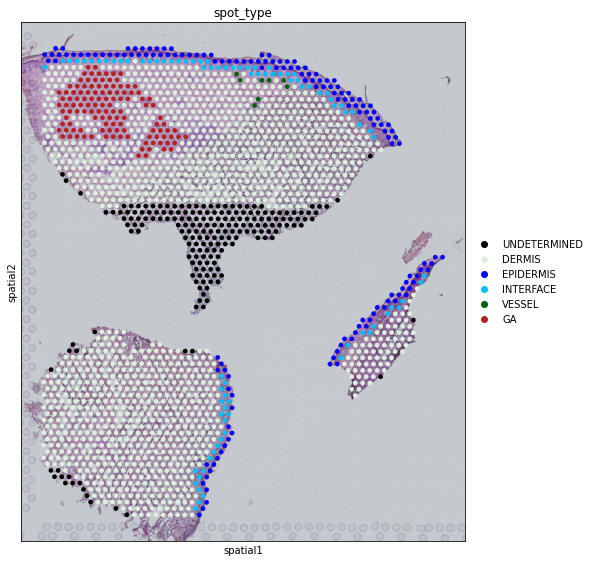

Trying to set attribute `._uns` of view, copying.


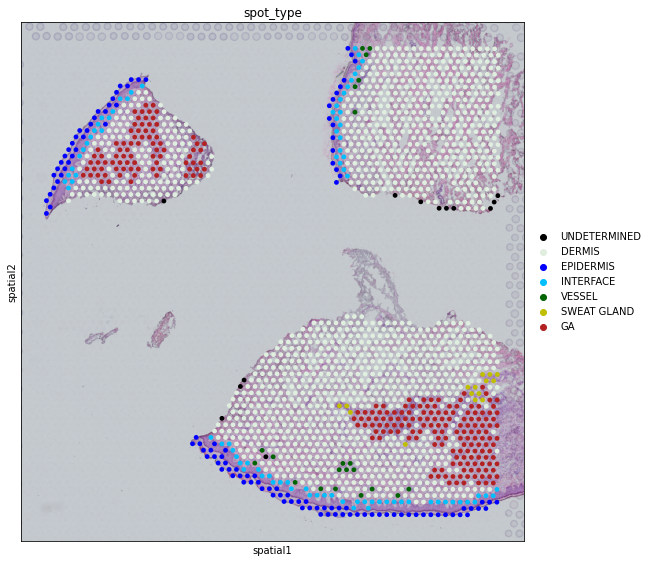

Trying to set attribute `._uns` of view, copying.


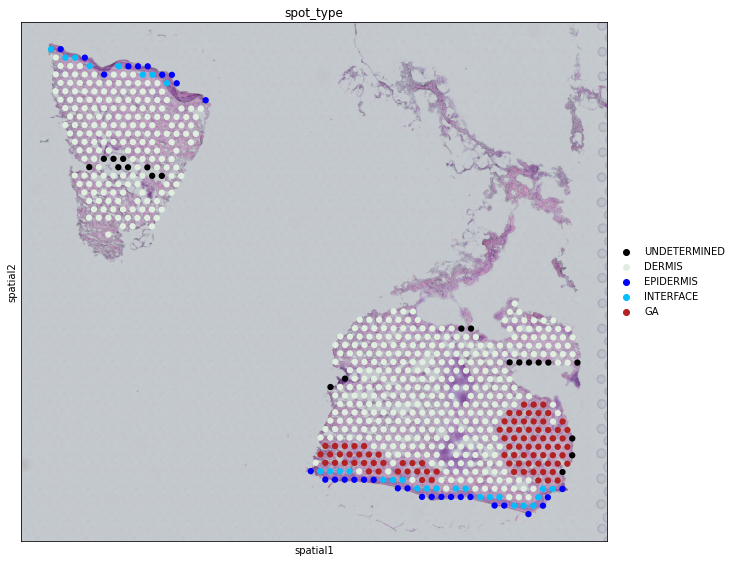

Trying to set attribute `._uns` of view, copying.


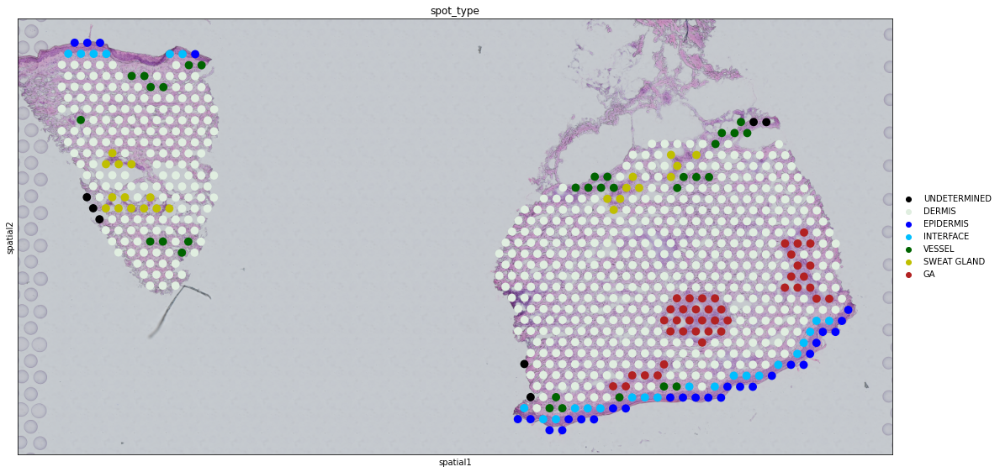

Trying to set attribute `._uns` of view, copying.


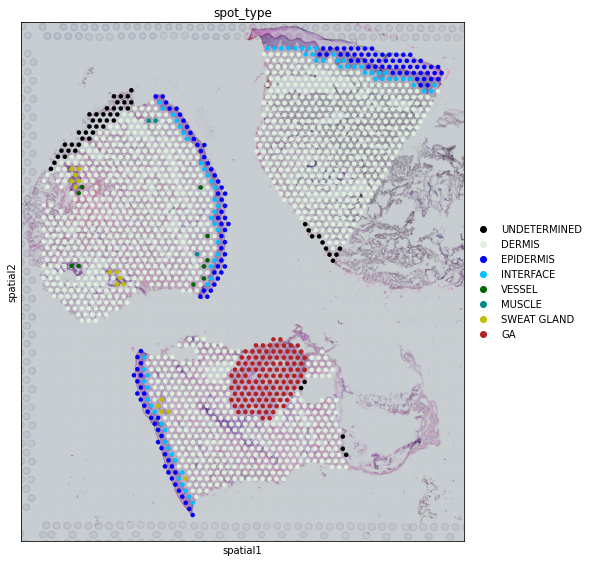

Trying to set attribute `._uns` of view, copying.


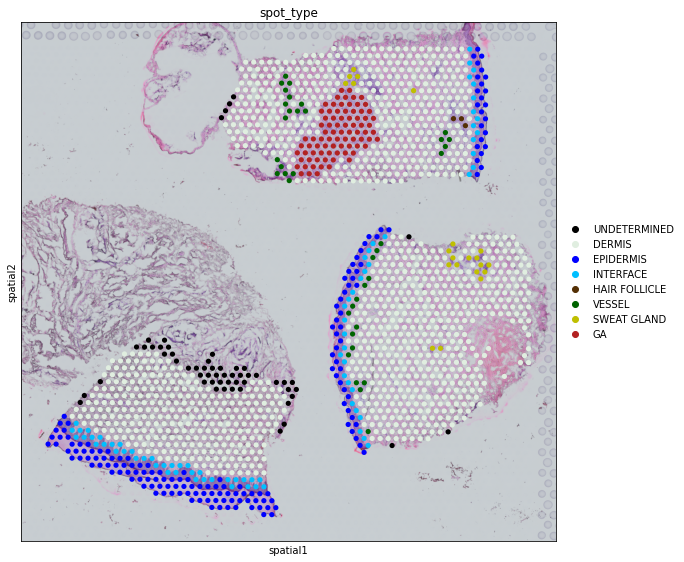

Trying to set attribute `._uns` of view, copying.


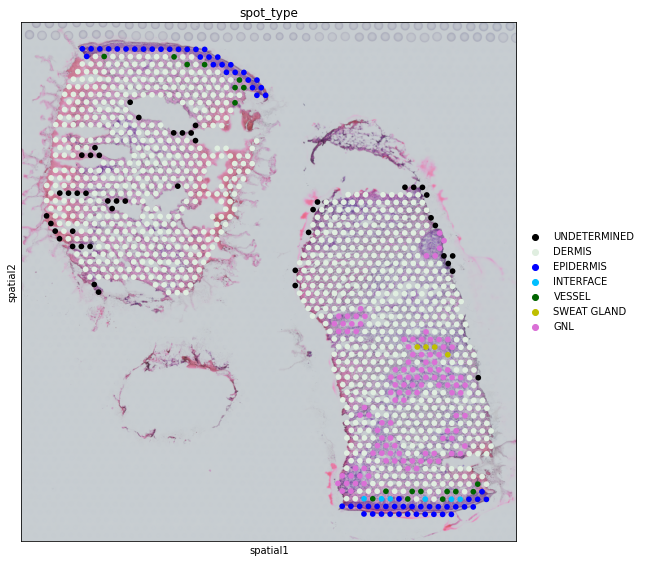

Trying to set attribute `._uns` of view, copying.


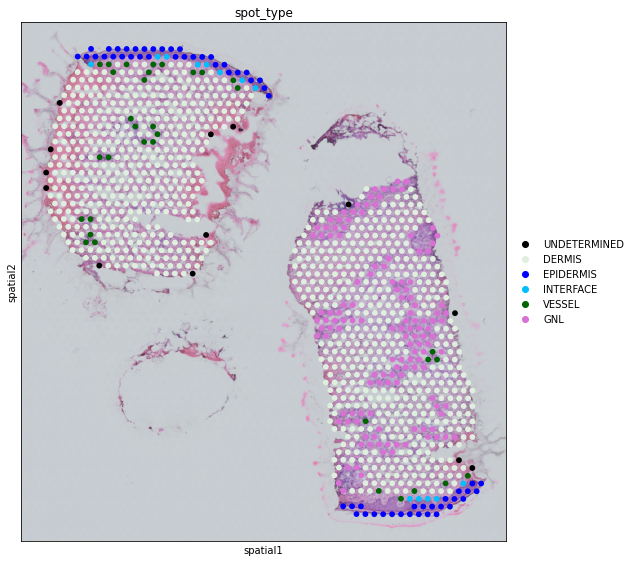

Trying to set attribute `._uns` of view, copying.


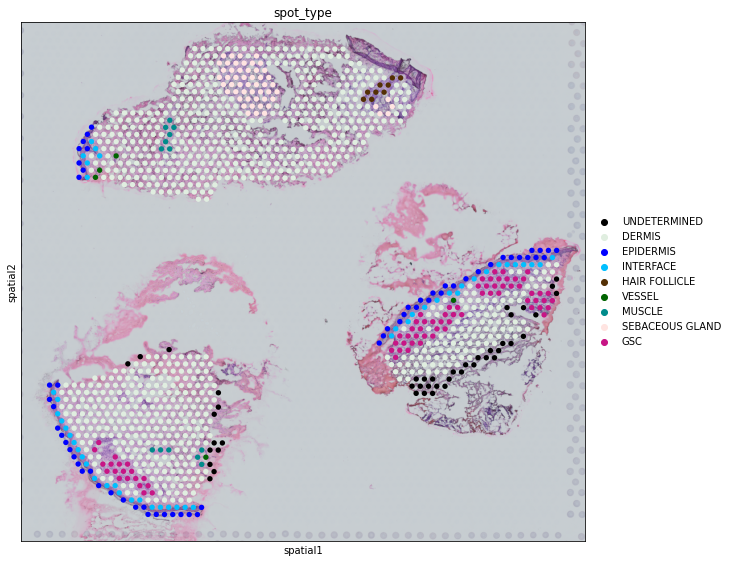

Trying to set attribute `._uns` of view, copying.


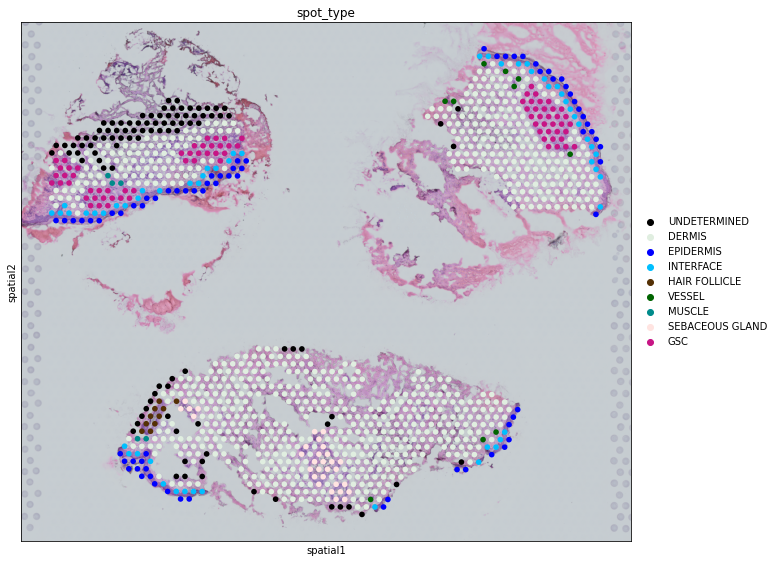

Trying to set attribute `._uns` of view, copying.


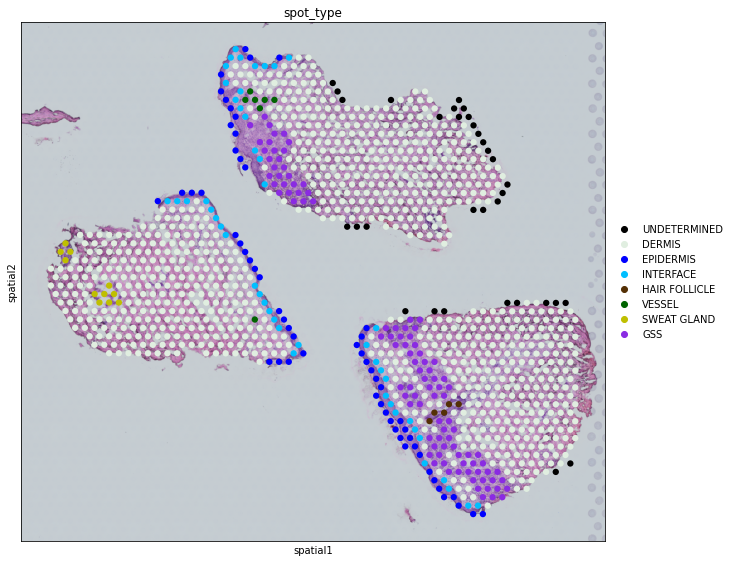

Trying to set attribute `._uns` of view, copying.


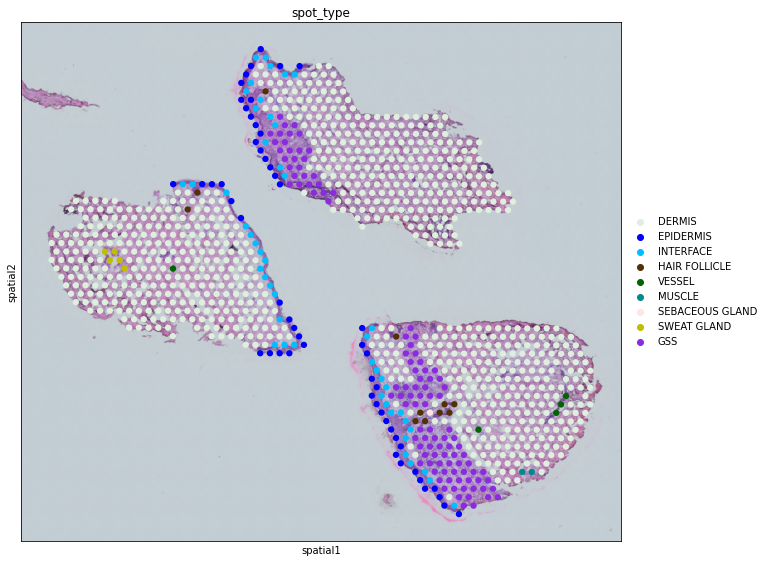

In [23]:
# Plot spot type
# 'P17851_1001', 'P17851_1002', 'P17851_1003', 'P17851_1004', ..., 'P18554_1005', 'P18554_1006', 'P18554_1007', 'P18554_1008'


fig = plt.figure(facecolor='w', edgecolor='k', figsize=(25, 8))
fig.subplots_adjust(bottom=0.05, left=0.05, top=0.95, right=0.75)
sub1 = fig.add_subplot(1, 1, 1)
sc.pl.spatial(adata[adata.obs['sample']=='P17851_1001'],
              library_id='P17851_1001', ax=sub1,
              color='spot_type',
              palette=_set_colors(adata[adata.obs['sample']=='P17851_1001'],
                                  'spot_type', spot_colors),
              #legend_loc='upper right',
              size=1, img_key='hires', alpha_img=1, alpha=1)

fig = plt.figure(facecolor='w', edgecolor='k', figsize=(25, 8))
fig.subplots_adjust(bottom=0.05, left=0.05, top=0.95, right=0.75)
sub1 = fig.add_subplot(1, 1, 1)
sc.pl.spatial(adata[adata.obs['sample']=='P17851_1002'],
              library_id='P17851_1002', ax=sub1,
              color='spot_type',
              palette=_set_colors(adata[adata.obs['sample']=='P17851_1002'],
                                  'spot_type', spot_colors),
              #legend_loc='upper right',
              size=1, img_key='hires', alpha_img=1, alpha=1)

fig = plt.figure(facecolor='w', edgecolor='k', figsize=(25, 8))
fig.subplots_adjust(bottom=0.05, left=0.05, top=0.95, right=0.75)
sub1 = fig.add_subplot(1, 1, 1)
sc.pl.spatial(adata[adata.obs['sample']=='P17851_1003'],
              library_id='P17851_1003', ax=sub1,
              color='spot_type',
              palette=_set_colors(adata[adata.obs['sample']=='P17851_1003'],
                                  'spot_type', spot_colors),
              #legend_loc='upper right',
              size=1, img_key='hires', alpha_img=1, alpha=1)

fig = plt.figure(facecolor='w', edgecolor='k', figsize=(25, 8))
fig.subplots_adjust(bottom=0.05, left=0.05, top=0.95, right=0.75)
sub1 = fig.add_subplot(1, 1, 1)
sc.pl.spatial(adata[adata.obs['sample']=='P17851_1004'],
              library_id='P17851_1004', ax=sub1,
              color='spot_type',
              palette=_set_colors(adata[adata.obs['sample']=='P17851_1004'],
                                  'spot_type', spot_colors),
              #legend_loc='upper right',
              size=1, img_key='hires', alpha_img=1, alpha=1)


fig = plt.figure(facecolor='w', edgecolor='k', figsize=(25, 8))
fig.subplots_adjust(bottom=0.05, left=0.05, top=0.95, right=0.75)
sub1 = fig.add_subplot(1, 1, 1)
sc.pl.spatial(adata[adata.obs['sample']=='P18554_1001'],
              library_id='P18554_1001', ax=sub1,
              color='spot_type',
              palette=_set_colors(adata[adata.obs['sample']=='P18554_1001'],
                                  'spot_type', spot_colors),
              #legend_loc='upper right',
              size=1, img_key='hires', alpha_img=1, alpha=1)

fig = plt.figure(facecolor='w', edgecolor='k', figsize=(25, 8))
fig.subplots_adjust(bottom=0.05, left=0.05, top=0.95, right=0.75)
sub1 = fig.add_subplot(1, 1, 1)
sc.pl.spatial(adata[adata.obs['sample']=='P18554_1002'],
              library_id='P18554_1002', ax=sub1,
              color='spot_type',
              palette=_set_colors(adata[adata.obs['sample']=='P18554_1002'],
                                  'spot_type', spot_colors),
              #legend_loc='upper right',
              size=1, img_key='hires', alpha_img=1, alpha=1)


fig = plt.figure(facecolor='w', edgecolor='k', figsize=(25, 8))
fig.subplots_adjust(bottom=0.05, left=0.05, top=0.95, right=0.75)
sub1 = fig.add_subplot(1, 1, 1)
sc.pl.spatial(adata[adata.obs['sample']=='P18554_1003'],
              library_id='P18554_1003', ax=sub1,
              color='spot_type',
              palette=_set_colors(adata[adata.obs['sample']=='P18554_1003'],
                                  'spot_type', spot_colors),
              #legend_loc='upper right',
              size=1, img_key='hires', alpha_img=1, alpha=1)

fig = plt.figure(facecolor='w', edgecolor='k', figsize=(25, 8))
fig.subplots_adjust(bottom=0.05, left=0.05, top=0.95, right=0.75)
sub1 = fig.add_subplot(1, 1, 1)
sc.pl.spatial(adata[adata.obs['sample']=='P18554_1004'],
              library_id='P18554_1004', ax=sub1,
              color='spot_type',
              palette=_set_colors(adata[adata.obs['sample']=='P18554_1004'],
                                  'spot_type', spot_colors),
              #legend_loc='upper right',
              size=1, img_key='hires', alpha_img=1, alpha=1)

fig = plt.figure(facecolor='w', edgecolor='k', figsize=(25, 8))
fig.subplots_adjust(bottom=0.05, left=0.05, top=0.95, right=0.75)
sub1 = fig.add_subplot(1, 1, 1)
sc.pl.spatial(adata[adata.obs['sample']=='P18554_1005'],
              library_id='P18554_1005', ax=sub1,
              color='spot_type',
              palette=_set_colors(adata[adata.obs['sample']=='P18554_1005'],
                                  'spot_type', spot_colors),
              #legend_loc='upper right',
              size=1, img_key='hires', alpha_img=1, alpha=1)

fig = plt.figure(facecolor='w', edgecolor='k', figsize=(25, 8))
fig.subplots_adjust(bottom=0.05, left=0.05, top=0.95, right=0.75)
sub1 = fig.add_subplot(1, 1, 1)
sc.pl.spatial(adata[adata.obs['sample']=='P18554_1006'],
              library_id='P18554_1006', ax=sub1,
              color='spot_type',
              palette=_set_colors(adata[adata.obs['sample']=='P18554_1006'],
                                  'spot_type', spot_colors),
              #legend_loc='upper right',
              size=1, img_key='hires', alpha_img=1, alpha=1)

fig = plt.figure(facecolor='w', edgecolor='k', figsize=(25, 8))
fig.subplots_adjust(bottom=0.05, left=0.05, top=0.95, right=0.75)
sub1 = fig.add_subplot(1, 1, 1)
sc.pl.spatial(adata[adata.obs['sample']=='P18554_1007'],
              library_id='P18554_1007', ax=sub1,
              color='spot_type',
              palette=_set_colors(adata[adata.obs['sample']=='P18554_1007'],
                                  'spot_type', spot_colors),
              #legend_loc='upper right',
              size=1, img_key='hires', alpha_img=1, alpha=1)


fig = plt.figure(facecolor='w', edgecolor='k', figsize=(25, 8))
fig.subplots_adjust(bottom=0.05, left=0.05, top=0.95, right=0.75)
sub1 = fig.add_subplot(1, 1, 1)
sc.pl.spatial(adata[adata.obs['sample']=='P18554_1008'],
              library_id='P18554_1008', ax=sub1,
              color='spot_type',
              palette=_set_colors(adata[adata.obs['sample']=='P18554_1008'],
                                  'spot_type', spot_colors),
              #legend_loc='upper right',
              size=1, img_key='hires', alpha_img=1, alpha=1)

#### Leiden_granulom <a class="anchor" id="section_4_3"></a>

In [ ]:
# Only granuloma spots, UMAPs and all slides

# fig = plt.figure(facecolor='w', edgecolor='k', figsize=(25, 8))
# fig.subplots_adjust(bottom=0.05, left=0.05, top=0.95, right=0.75)
# sub1 = fig.add_subplot(1, 4, 1)
# sc.pl.embedding(adata2, basis='X_umap_emb_BIOBANK', color='leiden_granulom_1',
#                 ax=sub1, size=40, legend_loc='upper right',
#                 use_raw=False, show=False)
# sub2 = fig.add_subplot(1, 4, 2)
# sc.pl.embedding(adata2, basis='X_umap_emb_BIOBANK', color='leiden_granulom_1.3',
#                 ax=sub2, size=40, legend_loc='upper right',
#                 use_raw=False, show=False)
# sub3 = fig.add_subplot(1, 4, 3)
# sc.pl.embedding(adata2, basis='X_umap_emb_BIOBANK', color='leiden_granulom_1.5',
#                 ax=sub3, size=40, legend_loc='upper right',
#                 use_raw=False, show=False)
# sub4 = fig.add_subplot(1, 4, 4)
# sc.pl.embedding(adata2, basis='X_umap_emb_BIOBANK', color='leiden_granulom_3',
#                 ax=sub4, size=40, legend_loc='upper right',
#                 use_raw=False, show=False)

# #print(adata_all.obs['leiden_granulom'].value_counts())
# fig, axes = _plot_spatial_all_slides(adata2, 'leiden_granulom', cluster_colors,
#                                      None, None, None)

#### Sophie's marker genes <a class="anchor" id="chapter5"></a>

In [26]:
# Sophie gave us a list of marker genes for granulomas, we will visualise their expression across the different samples

# First create the list of Sophie's marker genes
marker_gene_list = ['TLR1', 'ITGAL', 'TNFRSF1B', 'CD86', 'SPI1', 'BTK', 
                    'IL10RA', 'CLDN7', 'NUDT11', 'MIGA1', 'TAP1', 'TAP2', 'GLI1'] #FAM73A not found, name for that gene is also MIGA1

# Next visualise them
# Spatial expression of Sophie's marker genes
os.chdir("/Volumes/Drive/spatial_granuloma/output/") # Set working directory so it saves it in the drive
print(os.getcwd())

if not os.path.isfile(os.path.join('../output/plots/Marker_genes_Sophie/Marker_genes_TLR1.pdf')):
    print('plots not found, creating plots again!')
    for gene in marker_gene_list:
        file = '../output/plots/Marker_genes_Sophie/Marker_genes_' + gene + '.pdf' # name of the file for each gene
        print('saving here: ', file)
        fig20, axes20 = _plot_spatial_all_slides(adata, gene, None, file, # this function already gets all the plots for each of the patients, coloured by the specific gene expression across spots
                                                None, None)
else:
    print('check your plots at here: /Volumes/Drive/spatial_granuloma/output/')

/Volumes/Drive/spatial_granuloma/output
check your plots at here: /Volumes/Drive/spatial_granuloma/output/


Trying to set attribute `._uns` of view, copying.


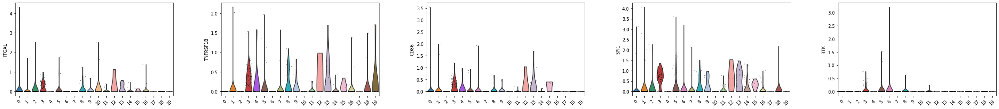

Trying to set attribute `._uns` of view, copying.


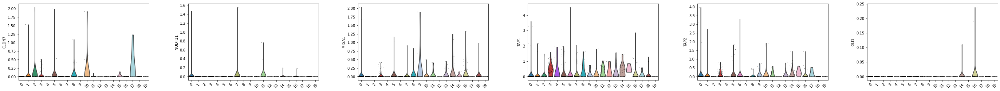

In [27]:
# Marker genes violin plots per cluster

# We also want to see the mean distribution across the leiden clusters to see if there is an unexpected distribution for e.g., granuloma spots
# for gene in marker_gene_list:
#     sc.pl.violin(adata[adata.obs['sample']=='P18554_1006'], gene,
#                 jitter = 0.4, groupby = 'leiden_r1.3_patient', rotation= 45)

# This is for just one of the samples
sc.pl.violin(adata[adata.obs['sample']=='P18554_1006'], marker_gene_list[1:6],
             jitter = 0.4, groupby = 'leiden_r1.3_patient', rotation= 45) # to visualise the distribution grouped by a different category, change the groupby argument
sc.pl.violin(adata[adata.obs['sample']=='P18554_1006'], marker_gene_list[7:13],
             jitter = 0.4, groupby = 'leiden_r1.3_patient', rotation= 45)

# This is the distribution across all samples
sc.pl.violin(adata, marker_gene_list[1:4],
             jitter = 0.4, groupby = 'leiden_r1.3_patient', rotation= 45)
sc.pl.violin(adata, marker_gene_list[5:8],
             jitter = 0.4, groupby = 'leiden_r1.3_patient', rotation= 45)
sc.pl.violin(adata, marker_gene_list[9:13],
             jitter = 0.4, groupby = 'leiden_r1.3_patient', rotation= 45)

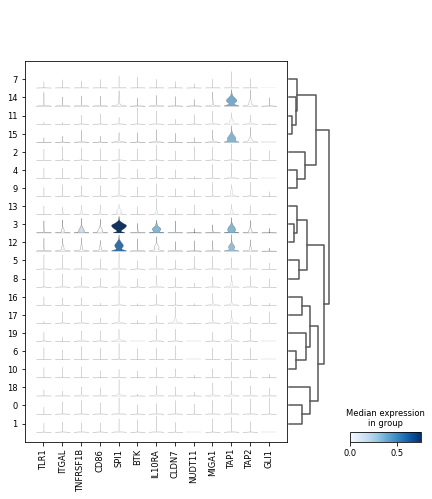

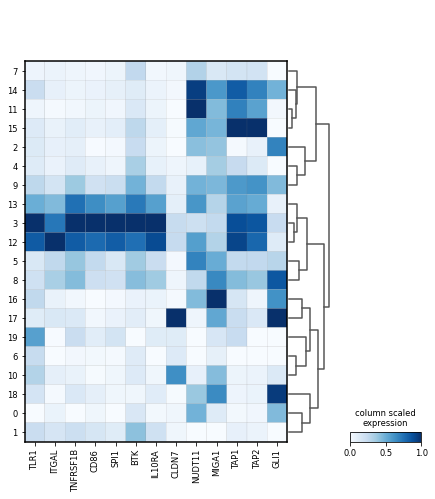

In [29]:
# Marker genes violin plots per cluster
# for gene in marker_gene_list:
#     sc.pl.violin(adata, gene,
#                 jitter = 0.4, groupby = 'leiden_r1.3_patient', rotation= 45)
sc.pl.stacked_violin(adata, marker_gene_list, groupby='leiden_r1.3_patient', swap_axes=False, dendrogram=True)

sc.pl.matrixplot(adata, marker_gene_list, 'leiden_r1.3_patient', 
                 dendrogram=True, cmap='Blues', standard_scale='var', colorbar_title='column scaled\nexpression')

# sc.pl.heatmap(adata, marker_gene_list, groupby='leiden_r1.3_patient', cmap='viridis', dendrogram=True)

In [30]:
# UMAP with marker genes

os.chdir("/Volumes/Drive/spatial_granuloma/output/") # Set working directory so it saves it in the drive
print(os.getcwd())

if not os.path.isfile(os.path.join('../output/plots/Marker_genes_Sophie/UMAP_TLR1.png')):
    print('plots not found, creating plots again!')
    
    fig, axes = plt.subplots(facecolor='w', edgecolor='k', figsize=(10, 8))
    sc.pl.embedding(adata, basis='X_umap_emb_BIOBANK', color='spot_type',
                    ax=axes, size=40, #legend_loc='upper right',
                    use_raw=False, wspace=0.4, show=False,
                    palette=_set_colors(adata, 'spot_type', granuloma_only_colours),
                    title='Patient batch correction')
    fig.savefig("../output/plots/Marker_genes_Sophie/UMAP_only_granuloma.png")

    for gene in marker_gene_list:
        file = "../output/plots/Marker_genes_Sophie/UMAP_" + gene + ".png" # name of the file for each gene
        fig, axes = plt.subplots(facecolor='w', edgecolor='k', figsize=(10, 8))
        sc.pl.embedding(adata, basis='X_umap_emb_BIOBANK', color=gene,
                        ax=axes, size=40, #legend_loc='upper right',
                        use_raw=False, wspace=0.4, show=False,
                        color_map = 'OrRd', 
                        #palette=_set_colors(adata, 'spot_type', granuloma_only_colours),
                        title='Patient batch correction - coloured by expression of gene ' + gene)
        print('saving here: ', file)
        fig.savefig(file)
else:
    print('check your plots at here: /Volumes/Drive/spatial_granuloma/output/Marker_genes_Sophie/')

/Volumes/Drive/spatial_granuloma/output
check your plots at here: /Volumes/Drive/spatial_granuloma/output/Marker_genes_Sophie/


#### Preliminary DGE <a class="anchor" id="chapter7"></a>

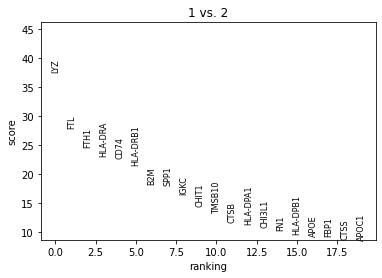

In [41]:
sc.tl.rank_genes_groups(adata, 'leiden_r1.3_patient', groups=['1'], reference='2', method='wilcoxon')
sc.pl.rank_genes_groups(adata, groups=['1'], n_genes=20)

In [ ]:
# DGE in different groups

# Dermis and all granuloma spots

# First create a new group where granuloma is any spot marked with GRANULOMA = 1, and dermis the rest
adata.obs['granuloma_dermis'] = ['granuloma' if str(i) == '1' else 'dermis' for i in adata.obs['GRANULOMA']]
adata.obs['granuloma_dermis']

# Next compute the dge and plot it
sc.tl.rank_genes_groups(adata, groupby='granuloma_dermis', method='wilcoxon', key_added='granuloma_dermis_DE_results')
sc.pl.rank_genes_groups(adata, groupby='granuloma_dermis', n_genes=15, sharey=False, key="granuloma_dermis_DE_results")

sc.pl.rank_genes_groups_stacked_violin(adata, n_genes=5, key="granuloma_dermis_DE_results", groupby="granuloma_dermis")

In [ ]:
fig, axes = plt.subplots(facecolor='w', edgecolor='k', figsize=(15, 8))
sc.pl.rank_genes_groups_stacked_violin(adata, n_genes=5, key="granuloma_dermis_DE_results", 
                                       groupby="granuloma_dermis", ax=axes)

In [ ]:
# List of granulomavsdermis_deg_genes (upregulated in dermis)
granulomavsdermis_deg_genes_d = [x[0] for x in adata.uns['granuloma_dermis_DE_results']['names'][:10]]
print(granulomavsdermis_deg_genes_d)

In [ ]:
os.chdir("/Volumes/Drive/spatial_granuloma/output/") # Set working directory so it saves it in the drive
print(os.getcwd())

if not os.path.isfile(os.path.join('../output/plots/DEG_top10/dermis/granulomavsdermis_deg_genes.png')):
    print('plots not found, creating plots again!')
    
    fig, axes = plt.subplots(facecolor='w', edgecolor='k', figsize=(10, 8))
    sc.pl.embedding(adata, basis='X_umap_emb_BIOBANK', color='spot_type',
                    ax=axes, size=40, #legend_loc='upper right',
                    use_raw=False, wspace=0.4, show=False,
                    palette=_set_colors(adata, 'spot_type', granuloma_only_colours),
                    title='Patient batch correction')
    fig.savefig("../output/plots/DEG_top10/dermis/granulomavsdermis_deg_genes.png")

    for gene in granulomavsdermis_deg_genes_d:
        file = "../output/plots/DEG_top10/dermis/UMAP_" + gene + ".png" # name of the file for each gene
        fig, axes = plt.subplots(facecolor='w', edgecolor='k', figsize=(10, 8))
        sc.pl.embedding(adata, basis='X_umap_emb_BIOBANK', color=gene,
                        ax=axes, size=40, #legend_loc='upper right',
                        use_raw=False, wspace=0.4, show=False,
                        color_map = 'OrRd', 
                        #palette=_set_colors(adata, 'spot_type', granuloma_only_colours),
                        title='Patient batch correction - coloured by expression of gene ' + gene)
        print('saving here: ', file)
        fig.savefig(file)
else:
    print('check your plots at here: /Volumes/Drive/spatial_granuloma/output/DEG_top10/dermis')


In [ ]:
os.chdir("/Volumes/Drive/spatial_granuloma/output/") # Set working directory so it saves it in the drive
print(os.getcwd())
deg_path = "../output/plots/DEG_top10/dermis/"

date = datetime.now().strftime("%Y%m%d") #For timestamp in file names

fig = plt.figure(facecolor='w', edgecolor='k', figsize=(20, 80))

if not os.path.isfile(os.path.join(deg_path + date + 'Spatial_expression_KRT1.pdf')):
    print('plots not found, creating plots again!')
    for gene in granulomavsdermis_deg_genes_d:
        file = deg_path + date + 'Spatial_expression_' + gene + '.pdf' # name of the file for each gene
        print('saving here: ', file)
        fig20, axes20 = _plot_spatial_all_slides(adata, gene, None, file, # this function already gets all the plots for each of the patients, coloured by the specific gene expression across spots
                                                None, None)
else:
    print('check your plots at here: ' + deg_path)

In [ ]:
# List of granulomavsdermis_deg_genes (upregulated in granuloma)
granulomavsdermis_deg_genes_g = [x[1] for x in adata.uns['granuloma_dermis_DE_results']['names'][:10]]
print(granulomavsdermis_deg_genes_g)

In [ ]:
os.chdir("/Volumes/Drive/spatial_granuloma/output/") # Set working directory so it saves it in the drive
print(os.getcwd())

if not os.path.isfile(os.path.join('../output/plots/DEG_top10/granuloma/granulomavsdermis_deg_genes.png')):
    print('plots not found, creating plots again!')
    
    fig, axes = plt.subplots(facecolor='w', edgecolor='k', figsize=(10, 8))
    sc.pl.embedding(adata, basis='X_umap_emb_BIOBANK', color='spot_type',
                    ax=axes, size=40, #legend_loc='upper right',
                    use_raw=False, wspace=0.4, show=False,
                    palette=_set_colors(adata, 'spot_type', granuloma_only_colours),
                    title='Patient batch correction')
    fig.savefig("../output/plots/DEG_top10/granuloma/granulomavsdermis_deg_genes.png")

    for gene in granulomavsdermis_deg_genes_g:
        file = "../output/plots/DEG_top10/granuloma/UMAP_" + gene + ".png" # name of the file for each gene
        fig, axes = plt.subplots(facecolor='w', edgecolor='k', figsize=(10, 8))
        sc.pl.embedding(adata, basis='X_umap_emb_BIOBANK', color=gene,
                        ax=axes, size=40, #legend_loc='upper right',
                        use_raw=False, wspace=0.4, show=False,
                        color_map = 'OrRd', 
                        #palette=_set_colors(adata_all, 'spot_type', granuloma_only_colours),
                        title='Patient batch correction - coloured by expression of gene ' + gene)
        print('saving here: ', file)
        fig.savefig(file)
else:
    print('check your plots at here: /Volumes/Drive/spatial_granuloma/output/DEG_top10/granuloma')


In [ ]:
os.chdir("/Volumes/Drive/spatial_granuloma/output/") # Set working directory so it saves it in the drive
print(os.getcwd())
deg_path = "../output/plots/DEG_top10/granuloma/"

date = datetime.now().strftime("%Y%m%d") #For timestamp in file names

fig = plt.figure(facecolor='w', edgecolor='k', figsize=(20, 80))

if not os.path.isfile(os.path.join(deg_path + date + 'Spatial_expression_TMSB4X.pdf')):
    print('plots not found, creating plots again!')
    for gene in granulomavsdermis_deg_genes_g:
        file = deg_path + date + 'Spatial_expression_' + gene + '.pdf' # name of the file for each gene
        print('saving here: ', file)
        fig20, axes20 = _plot_spatial_all_slides(adata, gene, None, file, # this function already gets all the plots for each of the patients, coloured by the specific gene expression across spots
                                                None, None)
else:
    print('check your plots at here: ' + deg_path)

In [ ]:
# Dermis and the different granuloma subtypes

sc.tl.rank_genes_groups(adata, 'spot_type', groups= ['GA', 'GNL', 'GSC', 'GSS'], reference = 'DERMIS', method='wilcoxon', key_added = "granulomasubtypes_dermis")
sc.pl.rank_genes_groups(adata, n_genes=15, sharey=False, key="granulomasubtypes_dermis")
sc.pl.rank_genes_groups_stacked_violin(adata, n_genes=5, key="granulomasubtypes_dermis", groupby="spot_type", groups= ['GA', 'GNL', 'GSC', 'GSS'], reference = 'DERMIS')

In [ ]:
# List of granulomavsdermis_deg_genes (upregulated in each of the granuloma subtypes)
granulomasubtypesvsdermis_deg_genes_ga = [x[0] for x in adata.uns['granulomasubtypes_dermis']['names'][:10]]
print('Genes upregulated in GA: ') 
print(granulomasubtypesvsdermis_deg_genes_ga)

granulomasubtypesvsdermis_deg_genes_gnl = [x[1] for x in adata.uns['granulomasubtypes_dermis']['names'][:10]]
print('Genes upregulated in GNL: ')
print(granulomasubtypesvsdermis_deg_genes_gnl)

granulomasubtypesvsdermis_deg_genes_gsc = [x[2] for x in adata.uns['granulomasubtypes_dermis']['names'][:10]]
print('Genes upregulated in GSC: ')
print(granulomasubtypesvsdermis_deg_genes_gsc)

granulomasubtypesvsdermis_deg_genes_gss = [x[3] for x in adata.uns['granulomasubtypes_dermis']['names'][:10]]
print('Genes upregulated in GSS: ')
print(granulomasubtypesvsdermis_deg_genes_gss)

In [ ]:
os.chdir("/Volumes/Drive/spatial_granuloma/output/") # Set working directory so it saves it in the drive
print(os.getcwd())

if not os.path.isfile(os.path.join('../output/plots/DEG_top10/granuloma_subtypes/GA_only_UMAP.png')):
    print('plots not found, creating plots again!')
    
    fig, axes = plt.subplots(facecolor='w', edgecolor='k', figsize=(10, 8))
    sc.pl.embedding(adata, basis='X_umap_emb_BIOBANK', color='spot_type',
                    ax=axes, size=40, #legend_loc='upper right',
                    use_raw=False, wspace=0.4, show=False,
                    palette=_set_colors(adata, 'spot_type', ga_only_colours),
                    title='Patient batch correction')
    fig.savefig("../output/plots/DEG_top10/granuloma_subtypes/GA_only_UMAP.png")

    for gene in granulomasubtypesvsdermis_deg_genes_ga:
        file = "../output/plots/DEG_top10/granuloma_subtypes/GA_UMAP_" + gene + ".png" # name of the file for each gene
        fig, axes = plt.subplots(facecolor='w', edgecolor='k', figsize=(10, 8))
        sc.pl.embedding(adata, basis='X_umap_emb_BIOBANK', color=gene,
                        ax=axes, size=40, #legend_loc='upper right',
                        use_raw=False, wspace=0.4, show=False,
                        color_map = 'OrRd', 
                        #palette=_set_colors(adata, 'spot_type', granuloma_only_colours),
                        title='Patient batch correction - coloured by expression of gene ' + gene)
        print('saving here: ', file)
        fig.savefig(file)
else:
    print('check your plots at here: /Volumes/Drive/spatial_granuloma/output/DEG_top10/granuloma_subtypes')
    
    
if not os.path.isfile(os.path.join('../output/plots/DEG_top10/granuloma_subtypes/GNL_only_UMAP.png')):
    print('plots not found, creating plots again!')
    
    fig, axes = plt.subplots(facecolor='w', edgecolor='k', figsize=(10, 8))
    sc.pl.embedding(adata, basis='X_umap_emb_BIOBANK', color='spot_type',
                    ax=axes, size=40, #legend_loc='upper right',
                    use_raw=False, wspace=0.4, show=False,
                    palette=_set_colors(adata, 'spot_type', gnl_only_colours),
                    title='Patient batch correction')
    fig.savefig("../output/plots/DEG_top10/granuloma_subtypes/GNL_only_UMAP.png")

    for gene in granulomasubtypesvsdermis_deg_genes_gnl:
        file = "../output/plots/DEG_top10/granuloma_subtypes/GNL_UMAP_" + gene + ".png" # name of the file for each gene
        fig, axes = plt.subplots(facecolor='w', edgecolor='k', figsize=(10, 8))
        sc.pl.embedding(adata, basis='X_umap_emb_BIOBANK', color=gene,
                        ax=axes, size=40, #legend_loc='upper right',
                        use_raw=False, wspace=0.4, show=False,
                        color_map = 'OrRd', 
                        #palette=_set_colors(adata, 'spot_type', granuloma_only_colours),
                        title='Patient batch correction - coloured by expression of gene ' + gene)
        print('saving here: ', file)
        fig.savefig(file)
else:
    print('check your plots at here: /Volumes/Drive/spatial_granuloma/output/DEG_top10/granuloma_subtypes')
    

if not os.path.isfile(os.path.join('../output/plots/DEG_top10/granuloma_subtypes/GSC_only_UMAP.png')):
    print('plots not found, creating plots again!')
    
    fig, axes = plt.subplots(facecolor='w', edgecolor='k', figsize=(10, 8))
    sc.pl.embedding(adata, basis='X_umap_emb_BIOBANK', color='spot_type',
                    ax=axes, size=40, #legend_loc='upper right',
                    use_raw=False, wspace=0.4, show=False,
                    palette=_set_colors(adata, 'spot_type', gsc_only_colours),
                    title='Patient batch correction')
    fig.savefig("../output/plots/DEG_top10/granuloma_subtypes/GSC_only_UMAP.png")

    for gene in granulomasubtypesvsdermis_deg_genes_gsc:
        file = "../output/plots/DEG_top10/granuloma_subtypes/GSC_UMAP_" + gene + ".png" # name of the file for each gene
        fig, axes = plt.subplots(facecolor='w', edgecolor='k', figsize=(10, 8))
        sc.pl.embedding(adata, basis='X_umap_emb_BIOBANK', color=gene,
                        ax=axes, size=40, #legend_loc='upper right',
                        use_raw=False, wspace=0.4, show=False,
                        color_map = 'OrRd', 
                        #palette=_set_colors(adata, 'spot_type', granuloma_only_colours),
                        title='Patient batch correction - coloured by expression of gene ' + gene)
        print('saving here: ', file)
        fig.savefig(file)
else:
    print('check your plots at here: /Volumes/Drive/spatial_granuloma/output/DEG_top10/granuloma_subtypes')
    
    

if not os.path.isfile(os.path.join('../output/plots/DEG_top10/granuloma_subtypes/GSS_only_UMAP.png')):
    print('plots not found, creating plots again!')
    
    fig, axes = plt.subplots(facecolor='w', edgecolor='k', figsize=(10, 8))
    sc.pl.embedding(adata, basis='X_umap_emb_BIOBANK', color='spot_type',
                    ax=axes, size=40, #legend_loc='upper right',
                    use_raw=False, wspace=0.4, show=False,
                    palette=_set_colors(adata, 'spot_type', gss_only_colours),
                    title='Patient batch correction')
    fig.savefig("../output/plots/DEG_top10/granuloma_subtypes/GSS_only_UMAP.png")

    for gene in granulomasubtypesvsdermis_deg_genes_gss:
        file = "../output/plots/DEG_top10/granuloma_subtypes/GSS_UMAP_" + gene + ".png" # name of the file for each gene
        fig, axes = plt.subplots(facecolor='w', edgecolor='k', figsize=(10, 8))
        sc.pl.embedding(adata, basis='X_umap_emb_BIOBANK', color=gene,
                        ax=axes, size=40, #legend_loc='upper right',
                        use_raw=False, wspace=0.4, show=False,
                        color_map = 'OrRd', 
                        #palette=_set_colors(adata, 'spot_type', granuloma_only_colours),
                        title='Patient batch correction - coloured by expression of gene ' + gene)
        print('saving here: ', file)
        fig.savefig(file)
else:
    print('check your plots at here: /Volumes/Drive/spatial_granuloma/output/DEG_top10/granuloma_subtypes')


In [ ]:
# All genes upregulated in a granuloma subtype
granulomasubtypesvsdermis_deg_genes_all = np.concatenate([granulomasubtypesvsdermis_deg_genes_ga, 
                                          granulomasubtypesvsdermis_deg_genes_gnl,
                                          granulomasubtypesvsdermis_deg_genes_gsc,
                                          granulomasubtypesvsdermis_deg_genes_gss]
print(granulomasubtypesvsdermis_deg_genes_all)
# os.chdir("/Volumes/Drive/spatial_granuloma/output/") # Set working directory so it saves it in the drive
# print(os.getcwd())
# deg_path = "../output/plots/DEG_top10/granuloma/"

# date = datetime.now().strftime("%Y%m%d") #For timestamp in file names

# fig = plt.figure(facecolor='w', edgecolor='k', figsize=(20, 80))

# if not os.path.isfile(os.path.join(deg_path + date + 'Spatial_expression_TMSB4X.pdf')):
#     print('plots not found, creating plots again!')
#     for gene in granulomavsdermis_deg_genes_g:
#         file = deg_path + date + 'Spatial_expression_' + gene + '.pdf' # name of the file for each gene
#         print('saving here: ', file)
#         fig20, axes20 = _plot_spatial_all_slides(adata, gene, None, file, # this function already gets all the plots for each of the patients, coloured by the specific gene expression across spots
#                                                 None, None)
# else:
#     print('check your plots at here: ' + deg_path)

#### mostly granuloma vs mostly dermis

In [ ]:
os.chdir("/Volumes/Drive/spatial_granuloma/output/") # Set working directory so it saves it in the drive
print(os.getcwd())
deg_path = "..output/plots/DEG_top10/granuloma/"

date = datetime.now().strftime("%Y%m%d") #For timestamp in file names

fig = plt.figure(facecolor='w', edgecolor='k', figsize=(20, 80))

for i, g in enumerate(genes):
    plt.subplot(15, 2, 1)
    plt.scatter(adata.obs['array_col'], -1.5*adata.obs['array_row'], c = adata.obs['spot_type'].map(spot_colors))
    plt.axis('equal')
    plt.subplot(15, 2, i + 1)
    plt.scatter(sample_info['array_col'], -1.5*sample_info['array_row'], c=norm_expr[g]);
    plt.title(g)
    plt.axis('equal')
    plt.colorbar(ticks=[]);
    
plt.savefig(spatialde_path + date + '_Top30_P17851_1001_91253-A.pdf')

In [ ]:
# Select a few clusters as "dermis" clusters and compare to the mostly "granuloma" clusters
mostly_granuloma = ['3', '12', '13']
mostly_dermis = ['0', '1', '2', '6', '10', '19']
adata.obs.loc[male_patients, 'sex'] = 'male'

# First create a new group where granuloma is any spot marked with GRANULOMA = 1, and dermis the rest
adata.obs['leiden_mostly_gran_dermis'] = 'unassigned'
adata.obs.loc[mostly_granuloma, 'leiden_r1.3_patient'] 


# Next compute the dge and plot it
# sc.tl.rank_genes_groups(adata, groupby='granuloma_dermis', method='wilcoxon', key_added='granuloma_dermis_DE_results')
# sc.pl.rank_genes_groups(adata, groupby='granuloma_dermis', n_genes=15, sharey=False, key="granuloma_dermis_DE_results")

# sc.pl.rank_genes_groups_stacked_violin(adata_all, n_genes=5, key="granuloma_dermis_DE_results", groupby="granuloma_dermis")

## UMAPs <a class="anchor" id="chapter6"></a>

#### Preprocessed <a class="anchor" id="section_6_1"></a>

In [ ]:
%%capture 
# Comment out this line if you want to show the output!

fig, axes = plt.subplots(facecolor='w', edgecolor='k', figsize=(12, 8))
sb.scatterplot(x=adata.obsm['X_umap_pp'][:,0], y=adata.obsm['X_umap_pp'][:,1])
              #color='spot_type', ax=axes, size=40, #legend_loc='upper right',
           #use_raw=False, show=False,
           #palette=_set_colors(adata, 'spot_type', spot_colors),
           #title='Without batch correction'
plt.show()
              
fig, axes = plt.subplots(facecolor='w', edgecolor='k', figsize=(12, 8))
sc.pl.embedding(adata, basis='X_umap_pp', color='spot_type', ax=axes, size=40, #legend_loc='upper right',
           use_raw=False, show=False,
           palette=_set_colors(adata, 'spot_type', spot_colors),
           title='Without batch correction')

#### Batch vs no correction - coloured by spot type <a class="anchor" id="section_6_2"></a>

In [ ]:
%%capture 
# Comment out this line if you want to show the output!

fig, axes = plt.subplots(facecolor='w', edgecolor='k', figsize=(10, 8))
sc.pl.embedding(adata, basis='X_umap_uc', color='spot_type',
                ax=axes, size=40, #legend_loc='upper right',
                use_raw=False, wspace=0.4, show=False,
                palette=_set_colors(adata, 'spot_type', spot_colors),
                title='Without preprocessing/batch correction')

fig, axes = plt.subplots(facecolor='w', edgecolor='k', figsize=(10, 8))
sc.pl.embedding(adata, basis='X_umap_pp', color='spot_type',
                ax=axes, size=40, #legend_loc='upper right',
                use_raw=False, wspace=0.4, show=False,
                palette=_set_colors(adata, 'spot_type', spot_colors),
                title='Without batch correction')

fig, axes = plt.subplots(facecolor='w', edgecolor='k', figsize=(10, 8))
sc.pl.embedding(adata, basis='X_umap_emb_BIOBANK', color='spot_type',
                ax=axes, size=40, #legend_loc='upper right',
                use_raw=False, wspace=0.4, show=False,
                palette=_set_colors(adata, 'spot_type', spot_colors),
                title='Patient batch correction')

fig, axes = plt.subplots(facecolor='w', edgecolor='k', figsize=(10, 8))
sc.pl.embedding(adata, basis='X_umap_emb_disease', color='spot_type',
                ax=axes, size=40, #legend_loc='upper right',
                use_raw=False, wspace=0.4, show=False,
                palette=_set_colors(adata, 'spot_type', spot_colors),
                title='Disease batch correction')

#### Batch vs no correction - coloured by skin_layer <a class="anchor" id="section_6_3"></a>

In [ ]:
%%capture 
# Comment out this line if you want to show the output!

fig, axes = plt.subplots(facecolor='w', edgecolor='k', figsize=(10, 8))
sc.pl.embedding(adata[np.argsort(adata.obs['skin_layer'])],
                basis='X_umap_uc', color='skin_layer',
                ax=axes, size=40, #legend_loc='upper right',
                use_raw=False, wspace=0.4, show=False,
                palette=_set_colors(adata[np.argsort(adata.obs['skin_layer'])],
                                    'skin_layer', dermis_colors),
                title='Without preprocessing/batch correction')

fig, axes = plt.subplots(facecolor='w', edgecolor='k', figsize=(10, 8))
sc.pl.embedding(adata[np.argsort(adata.obs['skin_layer'])],
                basis='X_umap_pp', color='skin_layer',
                ax=axes, size=40, #legend_loc='upper right',
                use_raw=False, wspace=0.4, show=False,
                palette=_set_colors(adata[np.argsort(adata.obs['skin_layer'])],
                                    'skin_layer', dermis_colors),
                title='Without batch correction')

fig, axes = plt.subplots(facecolor='w', edgecolor='k', figsize=(10, 8))
sc.pl.embedding(adata[np.argsort(adata.obs['skin_layer'])],
                basis='X_umap_emb_BIOBANK', color='skin_layer',
                ax=axes, size=40, #legend_loc='upper right',
                use_raw=False, wspace=0.4, show=False,
                palette=_set_colors(adata[np.argsort(adata.obs['skin_layer'])],
                                    'skin_layer', dermis_colors),
                title='Patient batch correction')

fig, axes = plt.subplots(facecolor='w', edgecolor='k', figsize=(10, 8))
sc.pl.embedding(adata[np.argsort(adata.obs['skin_layer'])],
                basis='X_umap_emb_disease', color='skin_layer',
                ax=axes, size=40, #legend_loc='upper right',
                use_raw=False, wspace=0.4, show=False,
                palette=_set_colors(adata[np.argsort(adata.obs['skin_layer'])],
                                    'skin_layer', dermis_colors),
                title='Disease batch correction')

#### Batch vs no correction - coloured by sample (DERMIS == 1, NON LESIONAL == 1, SAMPLE != 0) <a class="anchor" id="section_6_4"></a>

In [ ]:
%%capture 
# Comment out this line if you want to show the output!

fig, axes = plt.subplots(facecolor='w', edgecolor='k', figsize=(10, 8))
sc.pl.embedding(adata[(adata.obs["NON LESIONAL"]==1) &
                     (adata.obs["DERMIS"]==1) &
                     (adata.obs["SAMPLE"]!='0')],
                basis='X_umap_pp',
                color='sample',
                palette=['skyblue', 'dodgerblue',
                        'mediumseagreen', 'forestgreen',
                        'lightsteelblue', 'steelblue',
                        'gold', 'orange',
                        'red', 'brown',
                        'violet', 'm'],
                ax=axes, size=40, #legend_loc='upper right',
                use_raw=False, wspace=0.4, show=False,
                title='Without batch correction')

fig, axes = plt.subplots(facecolor='w', edgecolor='k', figsize=(10, 8))
sc.pl.embedding(adata[(adata.obs["NON LESIONAL"]==1) &
                     (adata.obs["DERMIS"]==1) &
                     (adata.obs["SAMPLE"]!='0')],
                basis='X_umap_emb_disease',
                color='sample',
                palette=['skyblue', 'dodgerblue',
                        'mediumseagreen', 'forestgreen',
                        'lightsteelblue', 'steelblue',
                        'gold', 'orange',
                        'red', 'brown',
                        'violet', 'm'],
                ax=axes, size=40, #legend_loc='upper right',
                use_raw=False, wspace=0.4, show=False,
                title='Disease batch correction')

fig, axes = plt.subplots(facecolor='w', edgecolor='k', figsize=(10, 8))
sc.pl.embedding(adata[(adata.obs["NON LESIONAL"]==1) &
                     (adata.obs["DERMIS"]==1) &
                     (adata.obs["SAMPLE"]!='0')],
                basis='X_umap_emb_BIOBANK',
                color='sample',
                palette=['skyblue', 'dodgerblue',
                        'mediumseagreen', 'forestgreen',
                        'lightsteelblue', 'steelblue',
                        'gold', 'orange',
                        'red', 'brown',
                        'violet', 'm'],
                ax=axes, size=40, #legend_loc='upper right',
                use_raw=False, wspace=0.4, show=False,
           title='Patient batch correction')

#### Batch vs no correction - coloured by sample (GRANULOMA == 1 and SAMPLE != 0) <a class="anchor" id="section_6_5"></a>

In [ ]:
%%capture 
# Comment out this line if you want to show the output!

fig, axes = plt.subplots(facecolor='w', edgecolor='k', figsize=(10, 8))
sc.pl.embedding(adata[(adata.obs["LESIONAL"]==1) &
                      (adata.obs["GRANULOMA"]==1) &
                      (adata.obs["SAMPLE"]!='0')],
                basis='X_umap_pp',
                color='sample',
                palette=['skyblue', 'dodgerblue',
                        'mediumseagreen', 'forestgreen',
                        'lightsteelblue', 'steelblue',
                        'gold', 'orange',
                        'red', 'brown',
                        'violet', 'm'],
                ax=axes, size=40, #legend_loc='upper right',
                use_raw=False, wspace=0.4, show=False,
                title='Without batch correction')

fig, axes = plt.subplots(facecolor='w', edgecolor='k', figsize=(10, 8))
sc.pl.embedding(adata[(adata.obs["LESIONAL"]==1) &
                      (adata.obs["GRANULOMA"]==1) &
                      (adata.obs["SAMPLE"]!='0')],
                basis='X_umap_emb_disease',
                color='sample',
                palette=['skyblue', 'dodgerblue',
                        'mediumseagreen', 'forestgreen',
                        'lightsteelblue', 'steelblue',
                        'gold', 'orange',
                        'red', 'brown',
                        'violet', 'm'],
                ax=axes, size=40, #legend_loc='upper right',
                use_raw=False, wspace=0.4, show=False,
                title='Disease batch correction')

fig, axes = plt.subplots(facecolor='w', edgecolor='k', figsize=(10, 8))
sc.pl.embedding(adata[(adata.obs["LESIONAL"]==1) &
                      (adata.obs["GRANULOMA"]==1) &
                      (adata.obs["SAMPLE"]!='0')],
                basis='X_umap_emb_BIOBANK',
                color='sample',
                palette=['skyblue', 'dodgerblue',
                        'mediumseagreen', 'forestgreen',
                        'lightsteelblue', 'steelblue',
                        'gold', 'orange',
                        'red', 'brown',
                        'violet', 'm'],
                ax=axes, size=40, #legend_loc='upper right',
                use_raw=False, wspace=0.4, show=False,
           title='Patient batch correction')

#### Before batch correction 

In [ ]:
# fig, axes = plt.subplots(facecolor='w', edgecolor='k', figsize=(10, 8))
#sc.tl.umap(adata, neighbors_key='neighbors_pp')
# sc.pl.umap(adata, color='spot_type', ax=axes, size=40, legend_loc='upper right',
#            use_raw=False, wspace=0.4, show=False, 
#            #groups=['ENDOTHELIAL', 'KERATINOCYTE', 'MUSCLE', 'SEBACEOUS GLAND',
#            #       'SWEAT GLAND', 'Granuloma an.', 'Necrobiosis lipoidica',
#            #       'Granuloma sarc. susp.', 'Granuloma sarc. cut.',
#            #       'Interface'],
#            #na_color = '#E0EEE0',
#            palette=_set_colors(adata, 'spot_type', spot_colors),
#            title='Before batch correction')

fig, axes = plt.subplots(facecolor='w', edgecolor='k', figsize=(10, 8))
sc.pl.embedding(adata, basis='X_umap_pp', color='spot_type', ax=axes, size=40, #legend_loc='upper right',
           use_raw=False, show=False,
           palette=_set_colors(adata, 'spot_type', spot_colors),
           title='Before batch correction')

# This gives the same figure but uses sc.pl.umap (does not work with adata_all)
# fig, axes = plt.subplots(facecolor='w', edgecolor='k', figsize=(10, 8))
# sc.pl.umap(adata, color='spot_type', ax=axes, size=40, legend_loc='upper right',
#            use_raw=False, wspace=0.4, show=False, 
#            palette=_set_colors(adata, 'spot_type', spot_colors),
#            title='Before batch correction')

#### Exporting plots: before and after batch correction <a class="anchor" id="section_6_6"></a>

/Volumes/Drive/spatial_granuloma/output
Saving here: 
../output/plots/20220913_Batch_correction_all_spot_types.pdf


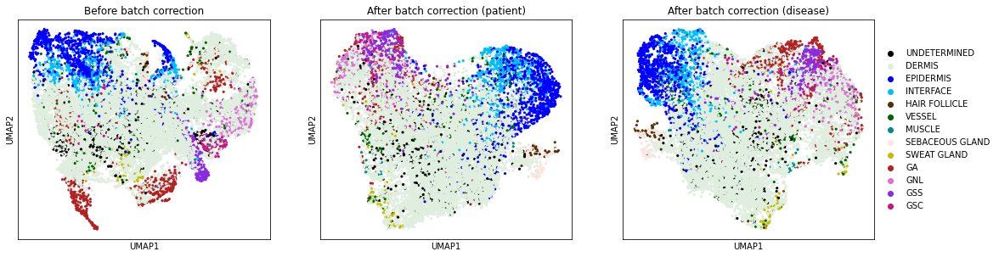

In [31]:
os.chdir("/Volumes/Drive/spatial_granuloma/output/") # Set working directory so it saves it in the drive
print(os.getcwd())

#This is the same as below but only works with adata (not adata_all):
fig = plt.figure(facecolor='w', edgecolor='k', figsize=(20, 4))
fig.subplots_adjust(bottom=0.05, left=0.05, top=0.95, right=0.75)
sub1 = fig.add_subplot(1, 3, 1)
sc.tl.umap(adata, neighbors_key='neighbors_pp')
sc.pl.umap(adata, color='spot_type', ax=sub1, size=40, legend_loc='upper right',
           use_raw=False, wspace=0.4, show=False,
           palette=_set_colors(adata, 'spot_type', spot_colors),
          title='Before batch correction')
sub2 = fig.add_subplot(1, 3, 2)
sc.tl.umap(adata, neighbors_key='neighbors_bc_BIOBANK')
sc.pl.umap(adata, color='spot_type', ax=sub2, size=40, legend_loc='upper right',
           use_raw=False, wspace=0.4, show=False,
           palette=_set_colors(adata, 'spot_type', spot_colors),
          title='After batch correction (patient)')
sub3 = fig.add_subplot(1, 3, 3)
sc.tl.umap(adata, neighbors_key='neighbors_bc_disease')
sc.pl.umap(adata, color='spot_type', ax=sub3, size=40, #legend_loc='upper right',
           use_raw=False, wspace=0.4, show=False,
           palette=_set_colors(adata, 'spot_type', spot_colors),
          title='After batch correction (disease)')

# Otherwise we will use the sc.pl.embedding function from scanpy which returns the same plots for adata_all:
# fig = plt.figure(facecolor='w', edgecolor='k', figsize=(20, 4))
# fig.subplots_adjust(bottom=0.05, left=0.05, top=0.95, right=0.75)
# sub1 = fig.add_subplot(1, 3, 1)
# sc.pl.embedding(adata_all, basis='X_umap_pp', color='spot_type', ax=sub1, size=40, legend_loc='None',
#            use_raw=False, show=False, 
#            palette=_set_colors(adata_all, 'spot_type', spot_colors),
#            title='Before batch correction')
# sub2 = fig.add_subplot(1, 3, 2)
# sc.pl.embedding(adata_all, basis='X_umap_emb_BIOBANK', color='spot_type', ax=sub2, size=40, legend_loc='None',
#            use_raw=False, show=False,
#            palette=_set_colors(adata_all, 'spot_type', spot_colors),
#            title='After batch correction (patient)')
# sub3 = fig.add_subplot(1, 3, 3)
# sc.pl.embedding(adata_all, basis='X_umap_emb_disease', color='spot_type', ax=sub3, size=40, #legend_loc='upper right',
#            use_raw=False, show=False,
#            palette=_set_colors(adata_all, 'spot_type', spot_colors),
#            title='After batch correction (disease)')

date = datetime.now().strftime("%Y%m%d")
print('Saving here: ')
print(f"../output/plots/{date}_Batch_correction_all_spot_types.pdf")
plt.savefig('../output/plots/' + date + '_Batch_correction_all_spot_types.pdf')

In [ ]:
%%capture 
# Comment out this line if you want to show the output!

fig, axes = plt.subplots(facecolor='w', edgecolor='k', figsize=(10, 8))
sc.tl.umap(adata, neighbors_key='neighbors_bc_BIOBANK')
sc.pl.umap(adata, color='spot_type', ax=axes, size=40, #legend_loc='upper right',
           use_raw=False, wspace=0.4, show=False,
           palette=_set_colors(adata, 'spot_type', spot_colors),
           title='Patient batch correction')

#### Exporting UMAPs: all leiden resolutions <a class="anchor" id="section_6_7"></a>

In [ ]:
%%capture 
# Comment out this line if you want to show the output!

os.chdir("/Volumes/Drive/spatial_granuloma/output/") # Set working directory so it saves it in the drive
print(os.getcwd())

date = datetime.now().strftime("%Y%m%d") #For timestamp in file names

sc.tl.umap(adata, neighbors_key='neighbors_bc_BIOBANK')

fig = plt.figure(facecolor='w', edgecolor='k', figsize=(20, 8))
fig.subplots_adjust(bottom=0.05, left=0.05, top=0.95, right=0.75)
sub1 = fig.add_subplot(2, 3, 1)
sc.pl.umap(adata, color='leiden_r0.8_patient', ax=sub1, size=40, legend_loc='upper right',
           use_raw=False, wspace=0.4, show=False,
           #palette=_set_colors(adata, 'spot_type', spot_colors),
          title='Leiden clustering (patient BC, r=0.8)')
sub2 = fig.add_subplot(2, 3, 2)
sc.pl.umap(adata, color='leiden_r1.0_patient', ax=sub2, size=40, legend_loc='upper right',
           use_raw=False, wspace=0.4, show=False,
           #palette=_set_colors(adata, 'spot_type', spot_colors),
          title='Leiden clustering (patient BC, r=1)')
sub3 = fig.add_subplot(2, 3, 3)
sc.pl.umap(adata, color='leiden_r1.3_patient', ax=sub3, size=40, legend_loc='upper right',
           use_raw=False, wspace=0.4, show=False,
           #palette=_set_colors(adata, 'spot_type', spot_colors),
          title='Leiden clustering (patient BC, r=1.3)')
sub4 = fig.add_subplot(2, 3, 4)
sc.pl.umap(adata, color='leiden_r1.5_patient', ax=sub4, size=40, legend_loc='upper right',
           use_raw=False, wspace=0.4, show=False,
           #palette=_set_colors(adata, 'spot_type', spot_colors),
          title='Leiden clustering (patient BC, r=1.5)')
sub5 = fig.add_subplot(2, 3, 5)
sc.pl.umap(adata, color='leiden_r3_patient', ax=sub5, size=40, legend_loc='upper right',
           use_raw=False, wspace=0.4, show=False,
           #palette=_set_colors(adata, 'spot_type', spot_colors),
          title='Leiden clustering (patient BC, r=3)')
sub6 = fig.add_subplot(2, 3, 6)
sc.pl.umap(adata, color='spot_type', ax=sub6, size=40, #legend_loc='upper right',
           use_raw=False, wspace=0.4, show=False,
           palette=_set_colors(adata, 'spot_type', spot_colors),
          title='Spot annotations (patient BC)')

plt.savefig('../output/plots/' + date + '_Leiden_clustering_resolutions.pdf')

In [ ]:
os.chdir("/Volumes/Drive/spatial_granuloma/output/")

#### Slides <a class="anchor" id="chapter8"></a>

#### Slides coloured by spot_type  <a class="anchor" id="section_8_1"></a>

In [42]:
%%capture 
# Comment out this line if you want to show the output!

### Getting labels and handles for spot_type

fig = plt.figure(facecolor='w', edgecolor='k', figsize=(20, 8))
fig.subplots_adjust(bottom=0.05, left=0.05, top=0.95, right=0.75)
sub1 = fig.add_subplot(1, 2, 1)
sc.pl.umap(adata, color='spot_type', ax=sub1, size=40, legend_loc='upper right',
           use_raw=False, wspace=0.4, show=False,
           palette=_set_colors(adata, 'spot_type', spot_colors),
          title='Before batch correction')
sub1.invert_xaxis()
sub1.invert_yaxis()
sub2 = fig.add_subplot(1, 2, 2)
sc.pl.umap(adata, color='spot_type', ax=sub2, size=40, #legend_loc='upper right',
           use_raw=False, wspace=0.4, show=False,
           palette=_set_colors(adata, 'spot_type', spot_colors),
          title='After batch correction')

handles_spot, labels_spot = sub2.get_legend_handles_labels()

In [43]:
%%capture 
# Comment out this line if you want to show the output! 

date = datetime.now().strftime("%Y%m%d")
print('Saving here: ')
print(f'../output/plots/' + date + '_spatial_spot_type_all_slides.pdf')

fig1, axes1 = _plot_spatial_all_slides(adata, 'spot_type', spot_colors,
                                       '../output/plots/' + date + '_spatial_spot_type_all_slides.pdf',
                                       handles_spot, labels_spot)

Trying to set attribute `._uns` of view, copying.
Trying to set attribute `._uns` of view, copying.
Trying to set attribute `._uns` of view, copying.
Trying to set attribute `._uns` of view, copying.
Trying to set attribute `._uns` of view, copying.
Trying to set attribute `._uns` of view, copying.
Trying to set attribute `._uns` of view, copying.
Trying to set attribute `._uns` of view, copying.
Trying to set attribute `._uns` of view, copying.
Trying to set attribute `._uns` of view, copying.
Trying to set attribute `._uns` of view, copying.
Trying to set attribute `._uns` of view, copying.


#### Slides coloured by skin_layer  <a class="anchor" id="section_8_2"></a>

In [16]:
%%capture 
# Comment out this line if you want to show the output!

### Getting labels and handles for skin_layer

fig = plt.figure(facecolor='w', edgecolor='k', figsize=(20, 8))
fig.subplots_adjust(bottom=0.05, left=0.05, top=0.95, right=0.75)
sub1 = fig.add_subplot(1, 2, 1)
sc.pl.umap(adata, color='skin_layer', ax=sub1, size=40, legend_loc='upper right',
           use_raw=False, wspace=0.4, show=False,
           palette=_set_colors(adata, 'skin_layer', dermis_colors),
          title='Before batch correction')
sub1.invert_xaxis()
sub1.invert_yaxis()
sub2 = fig.add_subplot(1, 2, 2)
sc.pl.umap(adata, color='skin_layer', ax=sub2, size=40, #legend_loc='upper right',
           use_raw=False, wspace=0.4, show=False,
           palette=_set_colors(adata, 'skin_layer', dermis_colors),
          title='After batch correction')

handles_dermis, labels_dermis = sub2.get_legend_handles_labels()

In [ ]:
%%capture 
# Comment out this line if you want to show the output!

date = datetime.now().strftime("%Y%m%d")
print('Saving here: ')
print(f'../output/plots/' + date + '_spatial_skin_layers_all_slides.pdf')

fig2, axes2 = _plot_spatial_all_slides(adata, 'skin_layer', dermis_colors,
                                       '../output/plots/' + date + '_spatial_skin_layers_all_slides.pdf',
                                       handles_dermis, labels_dermis)

#### Slides coloured by leiden r=1.3  <a class="anchor" id="section_6_9"></a>

In [44]:
%%capture 
# Comment out this line if you want to show the output!

### Getting labels and handles for leiden clusters r = 1.3
fig, ax = plt.subplots()
sc.pl.umap(adata, size=30, ax=ax, #Should actually be adata_BC 
           color='leiden_r1.3_patient', palette=_set_colors(adata, 'leiden_r1.3_patient', leiden_r13_colours))
handles_leiden, labels_leiden = ax.get_legend_handles_labels()

In [18]:
%%capture 
# Comment out this line if you want to show the output!

date = datetime.now().strftime("%Y%m%d")
print('Saving here: ')
print(f'../output/plots/' + date + '_spatial_leiden_r13_all_slides.pdf')

fig3, axes3 = _plot_spatial_all_slides(adata, 'leiden_r1.3_patient',
                                       leiden_r13_colours,
                                       '../output/plots/' + date + '_spatial_leiden_r13_all_slides.pdf',
                                       handles_leiden, labels_leiden)

Trying to set attribute `._uns` of view, copying.
Trying to set attribute `._uns` of view, copying.
Trying to set attribute `._uns` of view, copying.
Trying to set attribute `._uns` of view, copying.
Trying to set attribute `._uns` of view, copying.
Trying to set attribute `._uns` of view, copying.
Trying to set attribute `._uns` of view, copying.
Trying to set attribute `._uns` of view, copying.
Trying to set attribute `._uns` of view, copying.
Trying to set attribute `._uns` of view, copying.
Trying to set attribute `._uns` of view, copying.
Trying to set attribute `._uns` of view, copying.


#### Slides coloured by counts, MT fraction  <a class="anchor" id="section_8_3"></a>

In [ ]:
%%capture 
# Comment out this line if you want to show the output!

date = datetime.now().strftime("%Y%m%d")

fig4, axes4 = _plot_spatial_all_slides(adata, 'log_counts', None,
                                       '../output/plots/' + date + '_spatial_counts_QCnorm_all_slides.pdf',
                                       None, None)

#fig5, axes5 = _plot_spatial_all_slides(adata[adata.obs["SAMPLE"]!="0"], 'log_counts', None,
#                                       '../output/plots/spatial_counts_QCnorm_no0_all_slides.pdf',
#                                       None, None)

fig6, axes6 = _plot_spatial_all_slides(adata[adata.obs["SAMPLE"]=="0"], 'log_counts', None,
                                       '../output/plots/' + date + '_spatial_counts_QCnorm_only0_all_slides.pdf',
                                       None, None)

fig7, axes7 = _plot_spatial_all_slides(adata, 'mt_frac', None,
                                       '../output/plots/' + date + '_spatial_MTfrac_all_slides.pdf',
                                       None, None)

### Plot only the spot types

Trying to set attribute `._uns` of view, copying.


Saving here: 
../output/plots/20220913_spatial_onlyspotypes.pdf
P17851_1001


Trying to set attribute `._uns` of view, copying.


P17851_1002


Trying to set attribute `._uns` of view, copying.


P17851_1003


Trying to set attribute `._uns` of view, copying.


P17851_1004


Trying to set attribute `._uns` of view, copying.


P18554_1001


Trying to set attribute `._uns` of view, copying.


P18554_1002


Trying to set attribute `._uns` of view, copying.


P18554_1003


Trying to set attribute `._uns` of view, copying.


P18554_1004


Trying to set attribute `._uns` of view, copying.


P18554_1005


Trying to set attribute `._uns` of view, copying.


P18554_1006


Trying to set attribute `._uns` of view, copying.


P18554_1007


Trying to set attribute `._uns` of view, copying.


P18554_1008


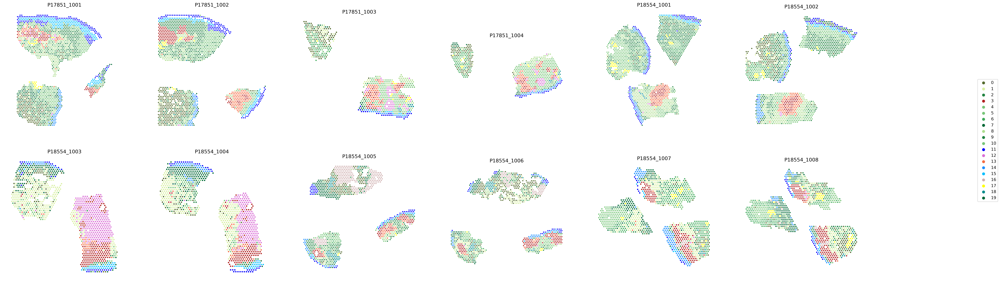

In [49]:
# Plot only the spot types

# %%capture # Comment out this line if you want to show the output!
date = datetime.now().strftime("%Y%m%d")
print('Saving here: ')
print('../output/plots/' + date + '_spatial_onlyspotypes.pdf')

fig3, axes3 = _plot_spatial_all_slides(adata, 'leiden_r1.3_patient',
                                       leiden_r13_colours, 
                                       filename = '../output/plots/' + date + '_spatial_onlyspotypes.pdf',
                                       handles = handles_leiden, labels = labels_leiden, alpha_image = 0)